# Centriole labels colocalisation analysis.

## Dataset: 4-6 hpf Cetn2:GFP & CS

This script will focus on the positional analysis of the centriole markers Centrin2:GFP and CenSpark. The goal is to deteRumne wherether Centrin2 and CenSpark label the centriole correct position or not. If both label are visible at the same location, then we can hypothesis that a centriole has been localized. 

In [1]:
import time
import tifffile
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from skimage.feature import blob_dog, blob_log
from skimage.filters import threshold_yen,try_all_threshold, threshold_minimum
from scipy.spatial import distance_matrix
from scipy.optimize import linear_sum_assignment
from scipy import ndimage
import skimage as ski
from pathlib import Path

import sys

my_path = Path.cwd().parent.parent / "src"
sys.path.append(str(my_path))
from detection import stardist_segmentation
from detection import blob_detection
from pairing import pairing
from visualization import visualization
from utils import utils

%matplotlib inline

In [2]:

ROOT = Path(r"K:\users\voland\images\cova_data\ZF_colocalisation\4-6hpf_CetnGFP_CS")

VOL_PATH = ROOT/"original" /"20260115CFHa_CetnGFP_CS_TL_4-6hpf_e4_t1-7.tif"
VOL_INTERPOLATED_PATH = ROOT/"interpolation"/"interpolated_20260115CFHa_CetnGFP_CS_TL_4-6hpf_e4_t1-7.tif"

GT_C0_CENTER_COORD_Z14_22_T3_PATH = ROOT/"results" / "ground_truth" / "C0_center_coord_z14-22_t3.csv"
GT_C1_CENTER_COORD_Z14_22_T3_PATH = ROOT / "results" / "ground_truth" / "C1_center_coord_z14-22_t3.csv"

C0_BLOB_CENTER_IMG_PATH = ROOT / "results" / "blob_detection" / "C0_results" / "C0_detected_img.tif"
C1_BLOB_CENTER_IMG_PATH = ROOT / "results" / "blob_detection" / "C1_results" / "C1_detected_img.tif"

C0_BLOB_CENTER_PATH = ROOT / "results" / "blob_detection" / "C0_results" / "C0_center_coord.csv"
C1_BLOB_CENTER_PATH = ROOT / "results" / "blob_detection" / "C1_results" / "C1_center_coord.csv"

GT_C0_LOW_THRESH_CENTER_COORD_Z14_22_T3_PATH =  ROOT / "results" / "ground_truth" / "C0_low_thresh_center_coord_z14-22_t3.csv"
C0_LOW_THRESH_BLOB_CENTER_IMG_PATH = ROOT / "results" / "blob_detection" / "C0_low_thresh_results" / "C0_detected_img.tif"
C0_LOW_THRESH_BLOB_CENTER_PATH = ROOT / "results" / "blob_detection" / "C0_low_thresh_results" / "C0_center_coord.csv"

PAIRING_MASK_OUTPUT_PATH = ROOT / "results" / "center_pairing" / "pairing_mask.tif"
LOW_PAIRING_MASK_OUTPUT_PATH = ROOT / "results" / "center_pairing" / "low_pairing_mask.tif"

In [3]:
FRAMES = 7
WIDTH_IN_MICRONS = 154.97
WIDTH_IN_PIXEL = 1024 

DEPTH_IN_MICRONS = 45.4712
DEPTH_IN_PIXEL = 80

WIDTH_RESOLUTION = WIDTH_IN_MICRONS/WIDTH_IN_PIXEL
DEPTH_RESOLUTION = DEPTH_IN_MICRONS/DEPTH_IN_PIXEL

## Data

In [4]:
start_time = time.time()
vol = tifffile.imread(VOL_PATH)
print(f"Openning the image took {(time.time() - start_time):.2f} seconds")

Openning the image took 16.49 seconds


## Image analysis

Before going to deep in the semgentation pipeline, we need to analyse our image and better understand it.
Let's first start with some general analysis.

In [5]:
print(f"Image shape: {vol.shape} \n")

CT_intensities = vol[:,:,0].flatten()
CS_intensities = vol[:,:,1].flatten()

print("Cetn2:GFP intensity metrics:")
print(f"Min value: {CT_intensities.min()}")
print(f"Max value: {CT_intensities.max()}")
print(f"Mean value: {CT_intensities.mean():.1f}")
print(f"Median value: {np.median(CT_intensities):.1f} \n")

print("CenSpark intensity metrics:")
print(f"Min value: {CS_intensities.min()}")
print(f"Max value: {CS_intensities.max()}")
print(f"Mean value: {CS_intensities.mean():.1f}")
print(f"Median value: {np.median(CS_intensities):.1f}")

Image shape: (7, 80, 3, 1024, 1024) 

Cetn2:GFP intensity metrics:
Min value: 0
Max value: 255
Mean value: 1.4
Median value: 0.0 

CenSpark intensity metrics:
Min value: 0
Max value: 255
Mean value: 2.3
Median value: 0.0


The shape of the dataset corresponds to (T,Z,C,Y,X). 
With the following channel configuration: 
- C0: Cetn2:GFP [green]
- C1: CenSpark [magenta]
- C2: Normal

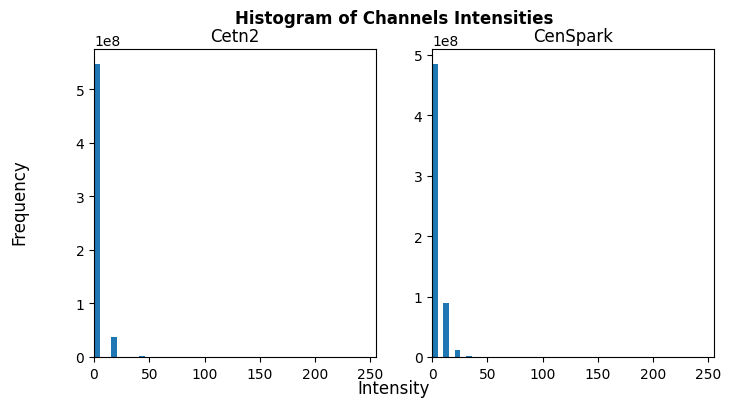

In [6]:
fig, axes = plt.subplots(1,2, figsize = (8,4))
axes[0].hist(CT_intensities, bins = 50)
axes[0].set_title('Cetn2')
axes[0].set_xlim(0, CT_intensities.max())
axes[1].hist(CS_intensities, bins = 50)
axes[1].set_title('CenSpark')
axes[1].set_xlim(0, CS_intensities.max())
fig.suptitle("Histogram of Channels Intensities", fontweight='bold')
fig.supxlabel('Intensity')
fig.supylabel('Frequency')
plt.show()

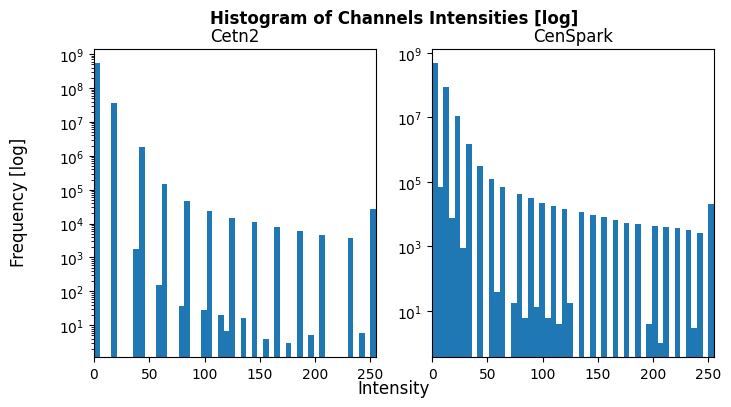

In [7]:
fig, axes = plt.subplots(1,2, figsize = (8,4))
axes[0].hist(CT_intensities, bins=50, log=True)
axes[0].set_title('Cetn2')
axes[0].set_xlim(0, CT_intensities.max())
axes[1].hist(CS_intensities, bins=50, log=True)
axes[1].set_title('CenSpark')
axes[1].set_xlim(0, CS_intensities.max())
fig.suptitle("Histogram of Channels Intensities [log]", fontweight='bold')
fig.supxlabel('Intensity')
fig.supylabel('Frequency [log]')
plt.show()

These histograms reveals that the images is highly saturated, where the centrioles bright spots have very high values compared to the rest.

Let's focus on the bright spots, by filtering all values below 

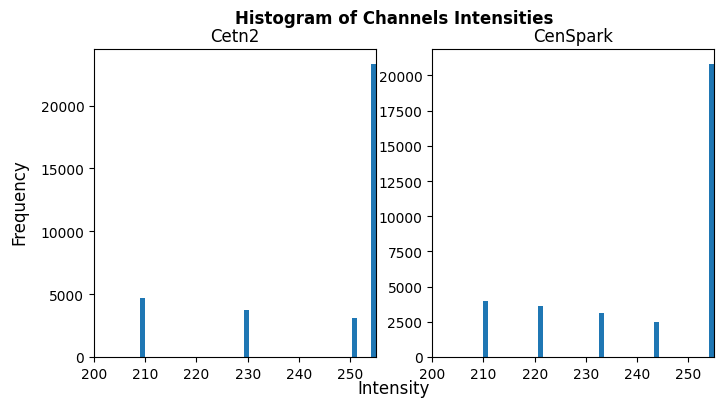

In [8]:
fig, axes = plt.subplots(1,2, figsize = (8,4))
axes[0].hist(CT_intensities[CT_intensities > 200], bins = 50)
axes[0].set_title('Cetn2')
axes[0].set_xlim(200, CT_intensities.max())
axes[1].hist(CS_intensities[CS_intensities > 200], bins = 50)
axes[1].set_title('CenSpark')
axes[1].set_xlim(200, CS_intensities.max())
fig.suptitle("Histogram of Channels Intensities", fontweight='bold')
fig.supxlabel('Intensity')
fig.supylabel('Frequency')
plt.show()

## 3D spots detection

To perform a colocalisation analysis of our marker, we need to deteRumne the center of the labeled centrioles for each marker and then corrolate their location. To do so, we need to detect the 3D position of the center of the labeled centrioles.

For 3D segmentation, we could either use Deep Learning methods, such as StarDist or Cellpose, or more traditional technic, such as Log or Dog filter.
From our previous analysis, we noticed that the images are highly saturated and constrated making normalisation almost impossible. As Deep Learning method need normalized images, we decided to opt for more traditional method which aren't impacted much by this.

**Warning**: For this part, we are going a lighter version of our image dataset, where all the images have been interpolated by a factor of 2.
This section focus on introducing the available methods using interpolated images. Lighther images are used to speed up the process. However I ran these algorithm on the real images using HPC and the results have been saved on my sessions. The results section of this notebook is analysing the results from the real images and not from the interpolated one.
In summary, the goal of this section is to see how to implement some spots detections methods and compared their performance on a smaller subset. 

Down below we are defining the subset we are going to use for the rest of the the analysis.

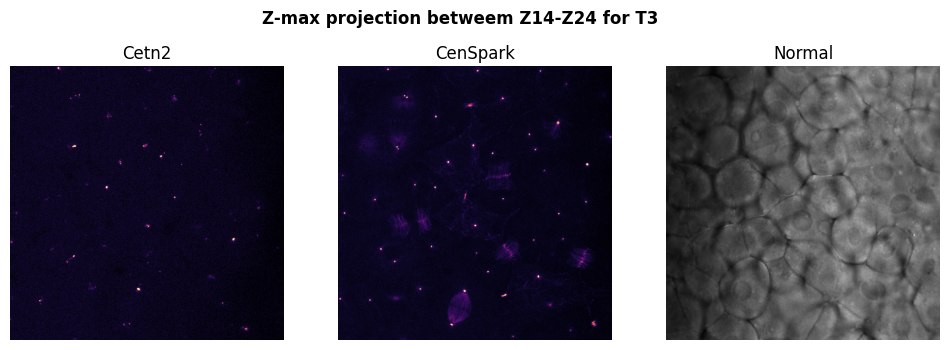

In [9]:
T = 2
Zs = list(range(13,24))

frame_slice = vol[T,Zs,:]
frame_slice_zmax = np.max(frame_slice, axis=0)


fig, axes = plt.subplots(1,3, figsize=(12,4))
axes[0].imshow(frame_slice_zmax[0], cmap="inferno")
axes[0].set_title("Cetn2")
axes[0].axis('off')
axes[1].imshow(frame_slice_zmax[1], cmap="inferno")
axes[1].set_title("CenSpark")
axes[1].axis("off")
axes[2].imshow(frame_slice_zmax[2], cmap="gray")
axes[2].set_title("Normal")
axes[2].axis("off")
fig.suptitle(f"Z-max projection betweem Z14-Z24 for T3", fontweight='bold')

plt.show()

In [10]:
C = 1
cs_frame_slice = frame_slice[:, C]
print(f"Image shape: {cs_frame_slice.shape}")
print(f"Min value: {cs_frame_slice.min()}")
print(f"Max value: {cs_frame_slice.max()}")
print(f"Mean value: {cs_frame_slice.mean():.1f}")

Image shape: (11, 1024, 1024)
Min value: 0
Max value: 255
Mean value: 2.8


Additionally to be able to evaluate the performance of our algorithm, we annotated manually the image, creating a ground truth dataset. 
However we should note that evaluation of the z-axis of our centers, is quite hard for a human and may thus be slighly incorrect. For our result comparison, we'll mostly focus on the xy position. 

In [11]:
gt_cs_center_time_slice = pd.read_csv(GT_C1_CENTER_COORD_Z14_22_T3_PATH)
gt_cs_center_time_slice.rename(columns={" ": "index"}, inplace=True)
gt_cs_center_time_slice["index"] = gt_cs_center_time_slice["index"] -1
gt_cs_center_time_slice["Slice"] = gt_cs_center_time_slice["Slice"] -1

print(f"Number of spots manually detected : {len(gt_cs_center_time_slice)}")
gt_cs_center_time_slice.head()

Number of spots manually detected : 44


,index,X,Y,Slice
0,0,186.750,12.083,1
1,1,248.938,110.000,5
2,2,257.000,116.625,9
3,3,365.875,188.250,3
4,4,521.667,17.083,7


In [12]:
gt_cs_center_time_slice[["Yum","Xum"]] = gt_cs_center_time_slice[["Y","X"]]*WIDTH_RESOLUTION
gt_cs_center_time_slice[["Zum"]] = gt_cs_center_time_slice[["Slice"]]*DEPTH_RESOLUTION

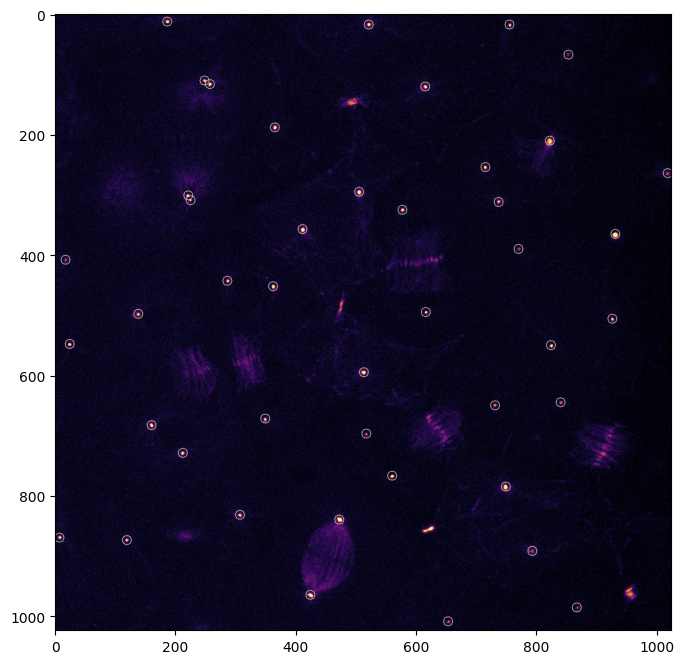

In [13]:
gt_cs_time_slice_detection = visualization.draw_circles(cs_frame_slice, gt_cs_center_time_slice[["Slice", "Y", "X"]].values)
gt_cs_time_slice_detection_zmax = np.max(gt_cs_time_slice_detection, axis=0)
plt.figure(figsize = (8,8))
plt.imshow(gt_cs_time_slice_detection_zmax, cmap="inferno")

### Stardist

#### Implementation
Most of the functions related to stardist segmentation have been implemented in the file `segmentation\centriole\stardist_segmentation.py`, you may refer to this script for more detailed implementations.

To make the process faster and a bit clearer (less spots on the images), we decided to take a specific slice of the volume.

Deeplearning data are trained on normalised images, thus we need to normalise our images.

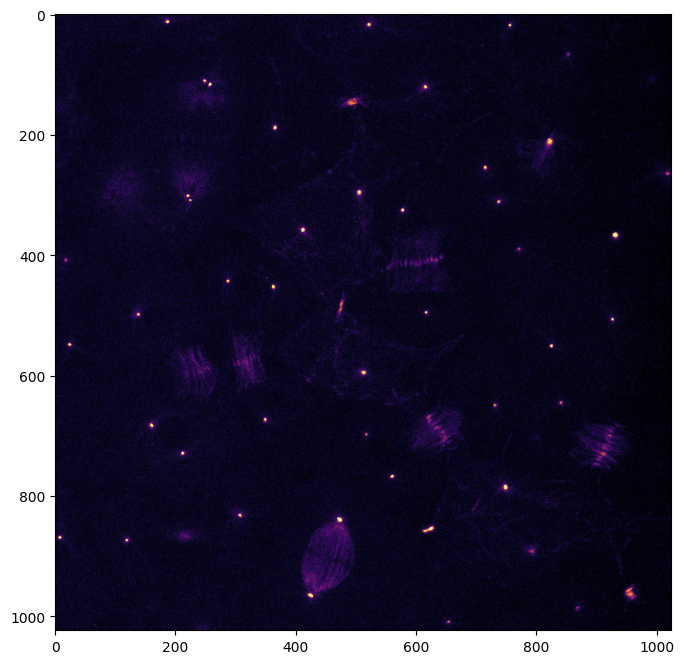

In [14]:
cs_norm_frame_slice = cs_frame_slice / cs_frame_slice.max()
cs_norm_frame_slice_zmax = np.max(cs_norm_frame_slice, axis=0)
plt.figure(figsize = (8,8))
plt.imshow(cs_norm_frame_slice_zmax, cmap="inferno")

In [15]:
print(f"Image shape: {cs_norm_frame_slice.shape}")
print(f"Min value: {cs_norm_frame_slice.min()}")
print(f"Max value: {cs_norm_frame_slice.max()}")
print(f"Mean value: {cs_norm_frame_slice.mean():.1f}")

Image shape: (11, 1024, 1024)
Min value: 0.0
Max value: 1.0
Mean value: 0.0


Now that our data are normalised we can use the 3D_demo model from Stardist to see how we can detect our spots.

In [16]:
[labels, polys] = stardist_segmentation.segment_frame(frame = cs_norm_frame_slice,
                                                      proba_thresh = 0.4, 
                                                      nms_thresh = 0.1,
                                                      scale = 1
                                                      )
print(f"{len(polys['points'])} spots detected")

Found model '3D_demo' for 'StarDist3D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.707933, nms_thresh=0.3.
65 spots detected


#### Results 
But let's also analyses the type of results we got form the stardist segmentation. 
We can see that we obtained the variables `labels` and `polys`.

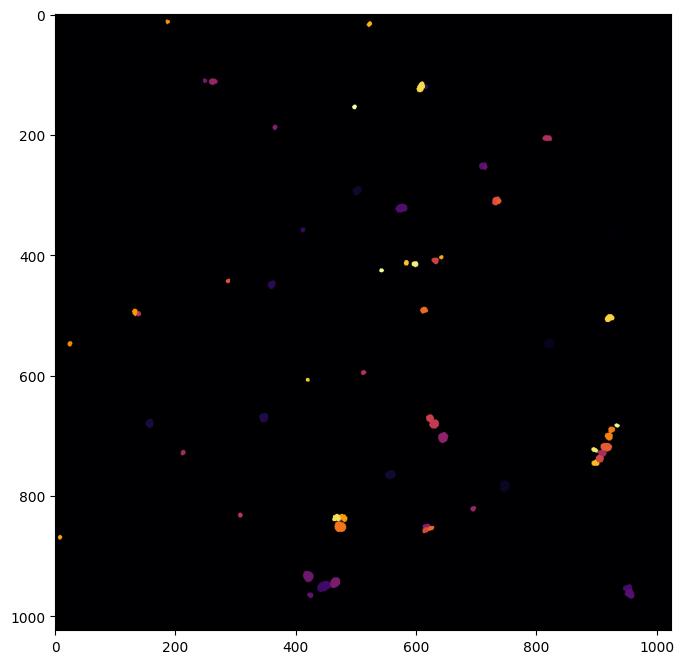

In [17]:
labels_zmax = np.max(labels, axis=0)
plt.figure(figsize=(8,8))
plt.imshow(labels_zmax, cmap="inferno")

We can see that `labels`is a masked images with the segmented regions.

In [18]:
print(f"Key of the poly dictionary: {polys.keys()}")
print(f"Fornat of the detected points: {polys['points'][:5]}")

Key of the poly dictionary: dict_keys(['dist', 'points', 'prob', 'rays', 'rays_vertices', 'rays_faces'])
Fornat of the detected points: [[  6. 362. 928.]
 [  3.  14. 518.]
 [  6. 548. 822.]
 [  4. 782. 746.]
 [  2. 292. 502.]]


And `polys`is a dictionary containing different information and features properities of our detected spots. We can find the coordinate of the points and annotate the image to compare it with the ground thruth.

Text(0.5, 0.98, 'Comparision of manual vs stardist detection')

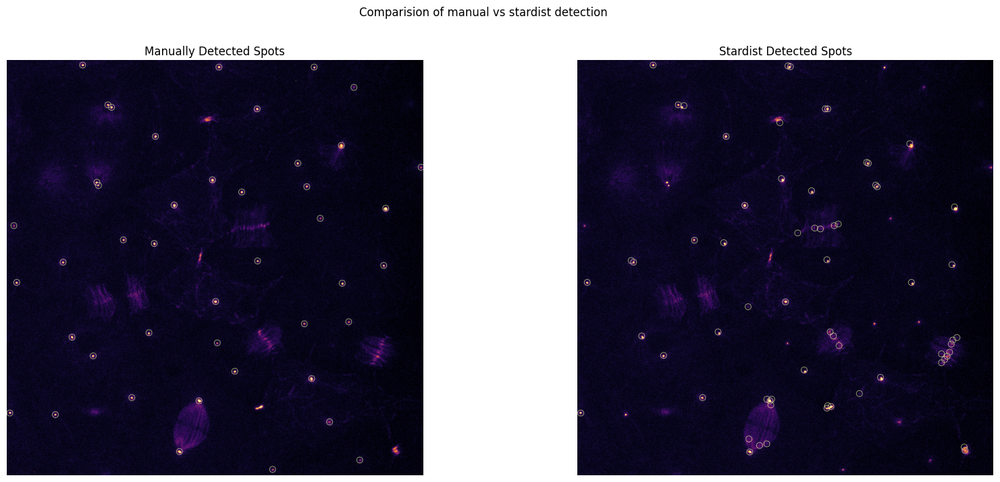

In [19]:
stardist_cs_frame_slice_detection = visualization.draw_circles(cs_frame_slice, polys["points"])

stardist_cs_frame_slice_detection_zmax = np.max(stardist_cs_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_cs_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(stardist_cs_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Stardist Detected Spots")
axes[1].axis("off")

fig.suptitle("Comparision of manual vs stardist detection")

Visually, we can see that not all the spots have been detected while incorrect spots are. 
To estimate more clearly our result, we can compute evaluation metrics.

To do so we are going to match each stardist detected spots with its closest equivalent in the ground truth. The coordinate don't need to be equal we just want to link each spots to deteRumne the number of true/false positive and true/false negative.
The pairing is going to be performed wih the xy coordinates. For the z axis, we are just going to ensure that their difference is lower than a minimal treshold. Manual estimation of the z-coord of the center isn't trivial and could be sligthly incorrect. That's why we aren't going put too much focus on this.  

In [20]:
# Let's converte the polys dictionary into a dataframe to handle the data and their index more easily
polys_df = pd.DataFrame(polys["points"], columns=["Z", "Y", "X"])
polys_df = polys_df.reset_index()

The pairing is done by linking the 2 spots for each dataset that has the lowest distance between them. Such optimization problem is callled `Assigment problem` and scikit offer algorithm to solve this problem.

In [21]:
polys_df[["Yum","Xum"]] = polys_df[["Y","X"]]*WIDTH_IN_MICRONS/WIDTH_IN_PIXEL
polys_df[["Zum"]] = polys_df[["Z"]]*DEPTH_IN_MICRONS/DEPTH_IN_PIXEL

In [22]:
stardist_dist_matrix = distance_matrix(polys_df[["Zum","Yum","Xum"]].values,gt_cs_center_time_slice[["Zum","Yum","Xum"]].values)

stardist_opti_row, stardist_opti_col = linear_sum_assignment(stardist_dist_matrix)

stardist_gt_pairing_df = pd.DataFrame({
    "stardist_idx": polys_df.index[stardist_opti_row].astype(int),
    "gt_idx": gt_cs_center_time_slice.index[stardist_opti_col].astype(int),
    "dist": stardist_dist_matrix[stardist_opti_row, stardist_opti_col]
})

Now that we have the distance between each paired spots, let's deteRumne which spots are considered as the same detection.

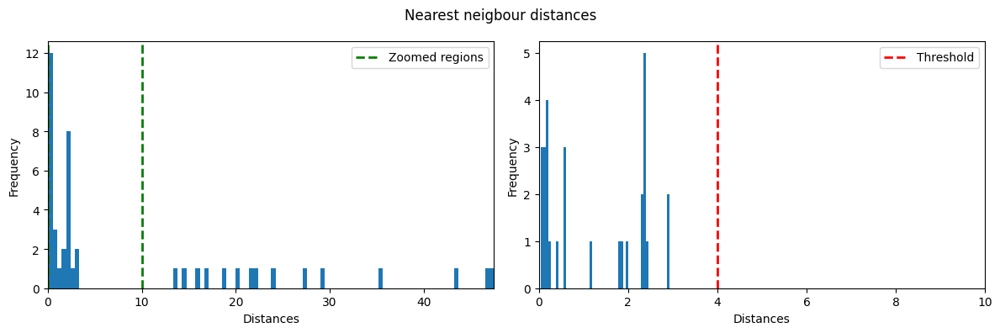

In [23]:
stardist_gt_pairing_dist = stardist_gt_pairing_df["dist"]
stardist_threhsold = 4
visualization.plot_zoomed_histogram(stardist_gt_pairing_dist, zooming_threshold = 10, threshold = stardist_threhsold, title = "Nearest neigbour distances", unit = "Distances")

Paired detection should have a very small distance, using the hisogram we can see that the smallest distances are between 0 and 2.5. There is one pair with an approximate distance of 6 that we would like to inverstigate.

In [24]:
stardist_gt_pairing_df_limit_dist = stardist_gt_pairing_df[stardist_gt_pairing_df["dist"] > 2][stardist_gt_pairing_df["dist"] < 3]
stardist_gt_pairing_df_limit_dist.sort_values("dist", ascending=False, inplace=True)
stardist_gt_pairing_df_limit_dist

933032373.py (1): Boolean Series key will be reindexed to match DataFrame index.


,stardist_idx,gt_idx,dist
2,3,31,2.926324
11,14,13,2.895401
23,29,7,2.449350
3,4,14,2.399503
4,5,35,2.373490
6,7,24,2.373490
0,0,10,2.370046
1,2,28,2.353022
7,8,16,2.348507
5,6,21,2.346560


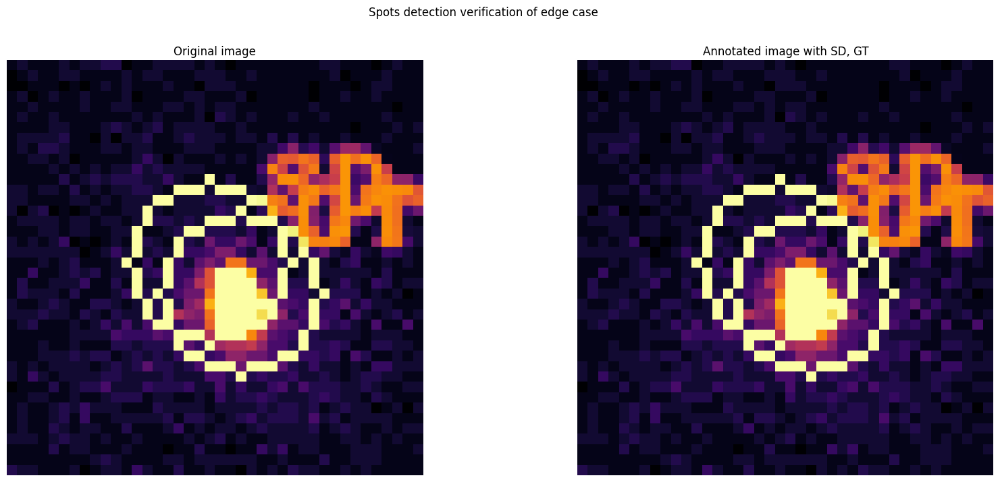

In [25]:
stardist_idx, gt_idx  = stardist_gt_pairing_df_limit_dist.iloc[0][["stardist_idx", "gt_idx"]].values.flatten()
stardist_coord = polys_df.loc[stardist_idx, ["Z","Y","X"]].values.T.astype(int)
gt_coord = gt_cs_center_time_slice.loc[gt_idx, ["Slice","Y","X"]].values.T.astype(int)

visualization.plot_points_comparison(stack = cs_frame_slice,
                                  points = [stardist_coord, gt_coord],
                                  labels = ["SD","GT"]
)

The detection isn't exactly positioned but let's say it's good enough to pair the 2. Let's set this pairing threshold to 6.

In [26]:
TP_idx = stardist_gt_pairing_df[stardist_gt_pairing_df["dist"] < stardist_threhsold].index
TP = len(TP_idx)
FP = len(polys_df) - TP
FN = len(gt_cs_center_time_slice) - TP

precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if(precision + recall) > 0 else 0

print(f"Precision of stardist detection: {precision*100:.2f}")
print(f"Recall of stardist detection: {recall*100:.2f}")
print(f"F1-score of stardist detection: {f1_score*100:.2f}")

Precision of stardist detection: 44.62
Recall of stardist detection: 65.91
F1-score of stardist detection: 53.21


We can see that the performances of the model are really bad and can't be used for detecting spots in our dataset.

### Thresholding

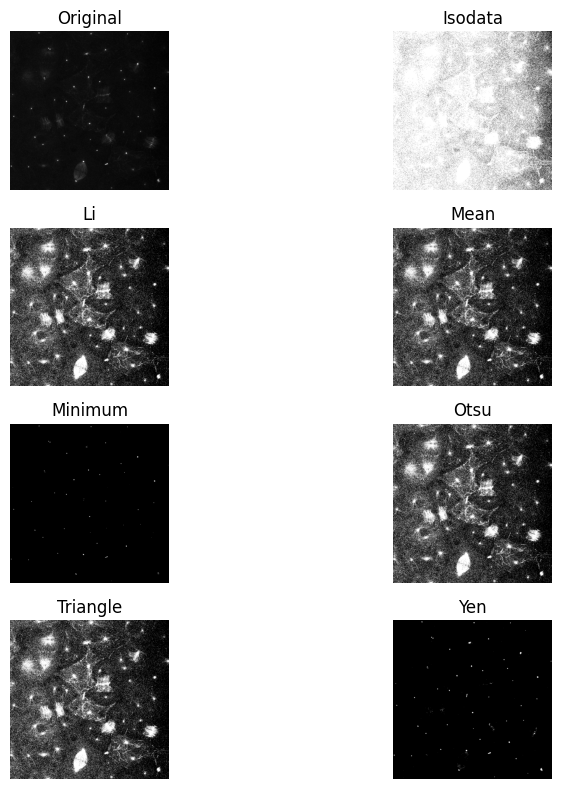

In [27]:
fig, ax = try_all_threshold(cs_norm_frame_slice_zmax, figsize=(10, 8), verbose=False)
plt.show()

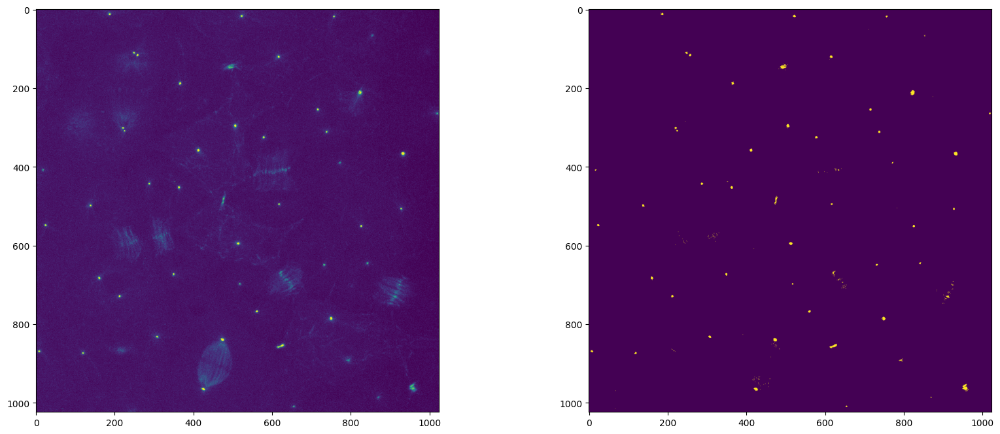

In [28]:
fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(cs_norm_frame_slice_zmax)
thresh_img = cs_norm_frame_slice_zmax > 0.35
axes[1].imshow(thresh_img)

Yen threholding values: 0.302734375


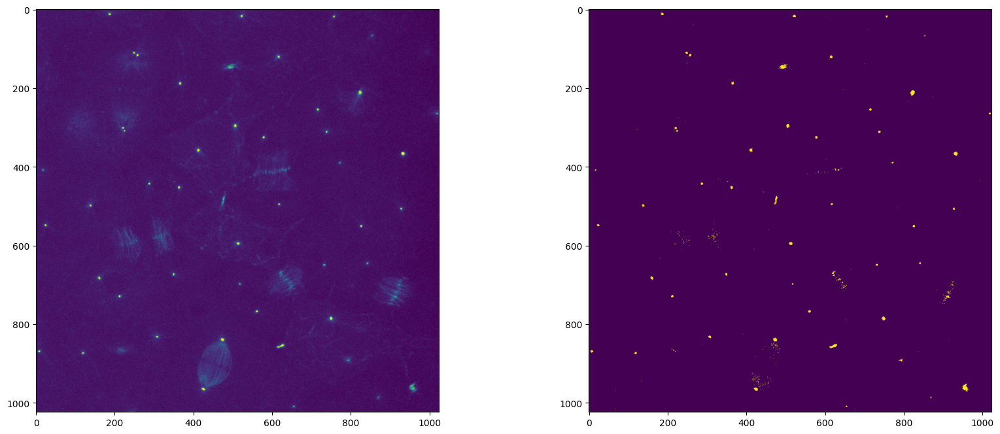

In [29]:
fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(cs_norm_frame_slice_zmax)
thresh_yen = threshold_yen(cs_norm_frame_slice_zmax)
print(f"Yen threholding values: {thresh_yen}")
yen_img = cs_norm_frame_slice_zmax > thresh_yen
axes[1].imshow(yen_img)

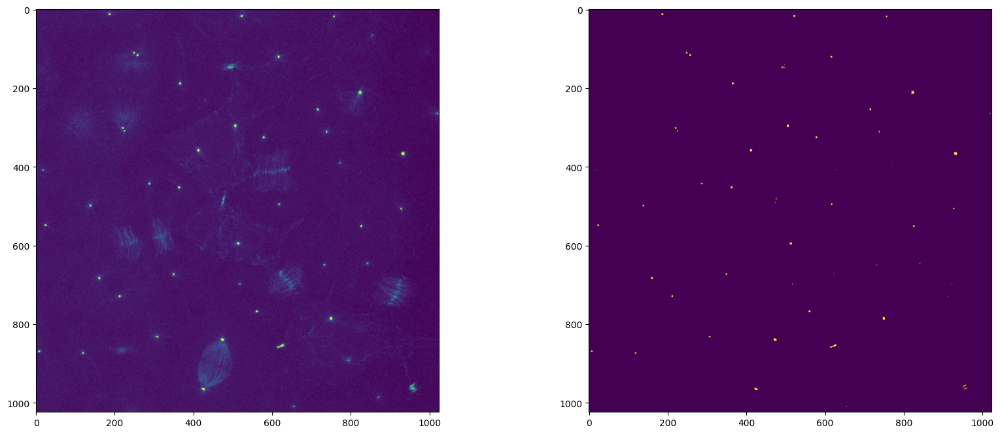

In [30]:
fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(cs_norm_frame_slice_zmax)
thresh_min = threshold_minimum(cs_norm_frame_slice_zmax)
min_img = cs_norm_frame_slice_zmax > thresh_min
axes[1].imshow(min_img)

Thresholding can give some results but as it can't really differenciate the roundish structure we don't really plan to use it.
However thresholding could be used to removed too big structures. 

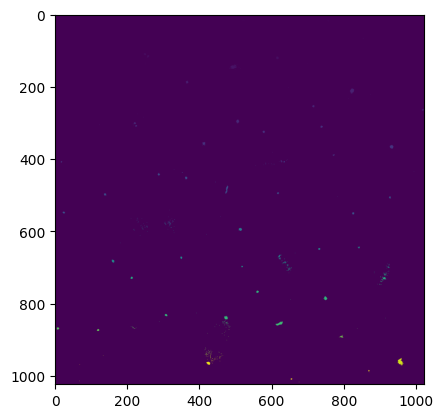

In [31]:
yen_labels, nshapes =ski.measure.label(yen_img, return_num = True)
plt.imshow(yen_labels)

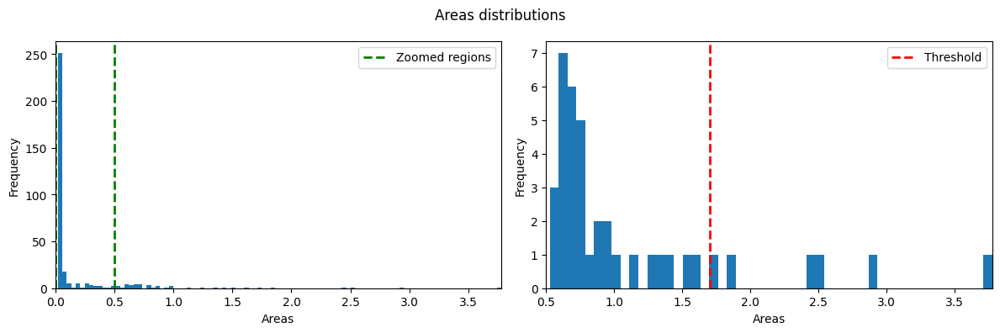

In [132]:
areas = ndimage.sum(yen_img, labels=yen_labels, index=range(1, nshapes))
areas = areas*WIDTH_RESOLUTION*WIDTH_RESOLUTION
areas_theshold = 1.7
visualization.plot_zoomed_histogram(areas.flatten(),zooming_threshold=0.5, threshold=areas_theshold, title = "Areas distributions", unit = "Areas", below=False)

Let's have a look at the biggest structures

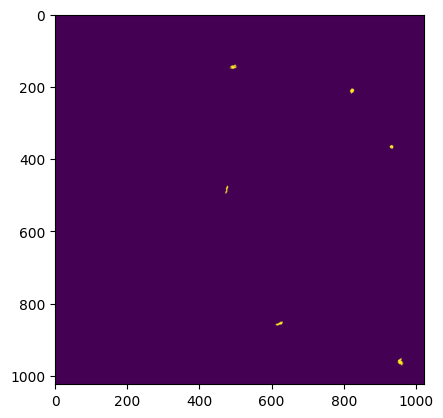

In [123]:
large_objects = ski.morphology.remove_small_objects(yen_labels, min_size=areas_theshold/(WIDTH_RESOLUTION*WIDTH_RESOLUTION))
plt.imshow(large_objects != 0)

### Scikit blob detection algorithm

To detect "blobs", bright spots on dark background, [scikit-image](https://scikit-image.org/docs/0.23.x/auto_examples/features_detection/plot_blob.html#sphx-glr-auto-examples-features-detection-plot-blob-py) suggest the three following algorithms: 
- Laplacian of Gaussian (LoG)
- Difference of Gaussian (DoG)
- DeteRumnant of Hessian (DoH)

Each method has its own advantages and disadvantages which can be found on their website. 
Let's note that Doh can't be used for 3D images and thus won't be investigated. 
Let's select an image at a specific slice and frame to study these methods. 

#### Laplacian of Gaussian (Log)

##### Implementation
This function relies on 3 main parameters, the sigma min, max and the threshold. 
The sigma min correspond to the minimal radius of the detected elements in pixel.

We know that a centriole has a diameter of about 250nm (0.25um) and a lenght of 150-500 nm. By looking at our images we can estimate that we are working with merged signal of 2 centrioles, thus we could multiple our limit by 2. As we don't known the orientation of our centriole diameter it could
Markers bound at some area, can't exactly tells the size of our signal but can do estimations. 

In [130]:
min_sigma_est = 0.1/WIDTH_RESOLUTION
max_sigma_est = 1/WIDTH_RESOLUTION
print(f"Estimated min sigma: {min_sigma_est:.2f} pixels")
print(f"Estimated max sigma: {max_sigma_est:.2f} pixels")

Estimated min sigma: 0.66 pixels
Estimated max sigma: 6.61 pixels


However when trying different parameters it appears that working with a sigma min of between 0.7-1 pixel (0.1um - 0.15um) was giving the best results. 
Also it appears that all detected centrioles had a radius below 5 pixels (0.75um).

Let's note that the function returns the sigma used to detect the blob which correspond rougly to sqrt(3)*sigma

In [34]:
blobs_log = blob_log(cs_frame_slice,min_sigma = 0.8, max_sigma=5, threshold=0.4)

In [143]:
blobs_log_df = pd.DataFrame(blobs_log, columns=["Z", "Y", "X", "R"])
blobs_log_df["R"] = blobs_log_df["R"]*np.sqrt(3)

# Changes the values from pixel to microns
blobs_log_df[["Rum"]] = blobs_log_df[["R"]]*WIDTH_RESOLUTION
blobs_log_df[["Yum","Xum"]] = blobs_log_df[["Y","X"]]*WIDTH_RESOLUTION
blobs_log_df[["Zum"]] = blobs_log_df[["Z"]]*DEPTH_RESOLUTION

blobs_log_df = blobs_log_df.reset_index()
print(f"{len(blobs_log_df)}/{len(gt_cs_center_time_slice)} spots detected with blob_log")

41/44 spots detected with blob_log


##### Results


We can start by visually analysing the performance of the algorithm. 

In [166]:
import cv2
def draw_circles(stack, centers, radius, color=255, thickness=1):
    """Draw circles on the stack images at the centers coordinates

    Args:
        stack: Input frame of shape [Z,Y,X]
        centers (int,int,int): List of the centers coordinates as [z,y,x]
    """
    res_stack = stack.copy()
    for i in range(len(centers)):
        center = centers[i]
        z, y, x = center.astype(int)
        utils.verif_stack_point(stack, center)
        r = int(np.sqrt(3)*radius[i])*2
        cv2.circle(res_stack[z], center=(x, y), radius=r, color=color, thickness=thickness)
    return res_stack

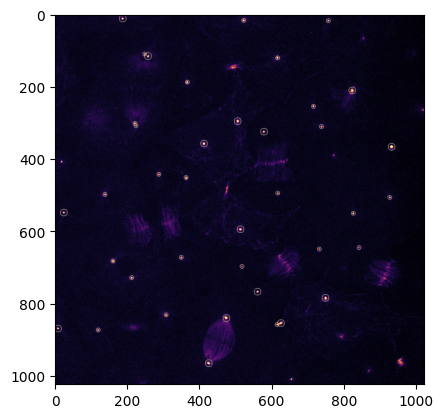

In [167]:
test = draw_circles(cs_frame_slice,  blobs_log_df[["Z","Y","X"]].values, radius = blobs_log_df["R"].values.astype(int))
test = np.max(test, axis=0)

plt.imshow(test, cmap="inferno")

Text(0.5, 0.98, 'Comparision of manual vs Log detection')

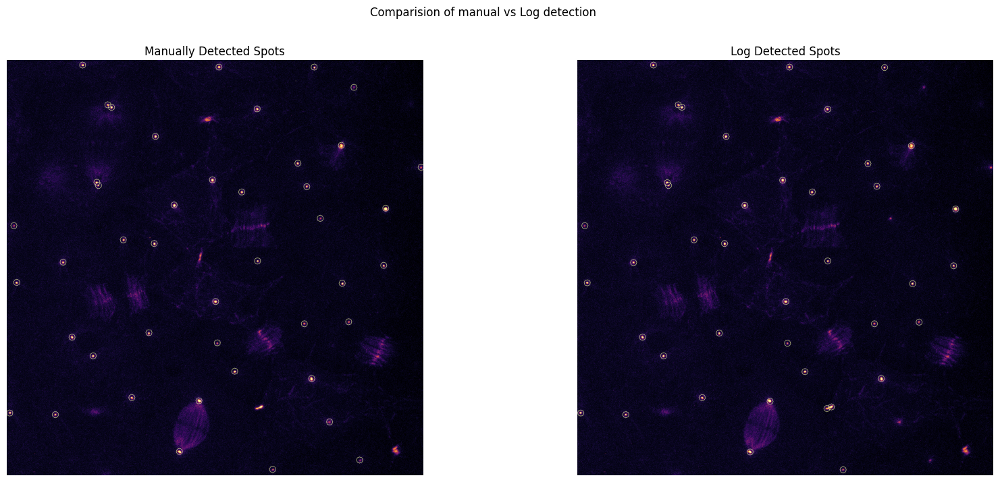

In [144]:
log_cs_frame_slice_detection = visualization.draw_circles(cs_frame_slice, blobs_log_df[["Z","Y","X"]].values)

log_cs_frame_slice_detection_zmax = np.max(log_cs_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_cs_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(log_cs_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Log Detected Spots")
axes[1].axis("off")

fig.suptitle("Comparision of manual vs Log detection")

Log algorithm seems to have detected alsmost all the spots. 

In [145]:
print(f"Dataset composition \n {blobs_log_df.groupby('Rum').index.count()}")

Dataset composition 
 Rum
0.209700     2
0.332025    24
0.454350    12
0.576675     3
Name: index, dtype: int64


Let's verfiy that the spots of size greater than 1 pixels are really spots we are interesting in.

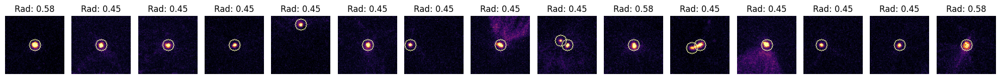

In [146]:
log_idx_large_size = blobs_log_df[blobs_log_df["Rum"] > 0.4].index

log_points = blobs_log_df.iloc[log_idx_large_size][["Z","Y","X"]].values.astype(int)
log_radius = blobs_log_df.iloc[log_idx_large_size]["Rum"].values

visualization.plot_points_closeup(stack = log_cs_frame_slice_detection,points = log_points, radius =log_radius, window_size=80)

All spots have an expected and common size. 

In [39]:
log_dist_matrix = distance_matrix(blobs_log_df[["Zum","Yum","Xum"]].values,gt_cs_center_time_slice[["Zum","Yum","Xum"]].values)

log_opti_row, log_opti_col = linear_sum_assignment(log_dist_matrix)

log_gt_pairing_df = pd.DataFrame({
    "log_idx": blobs_log_df.index[log_opti_row].astype(int),
    "gt_idx": gt_cs_center_time_slice.index[log_opti_col].astype(int),
    "dist": log_dist_matrix[log_opti_row, log_opti_col]
})

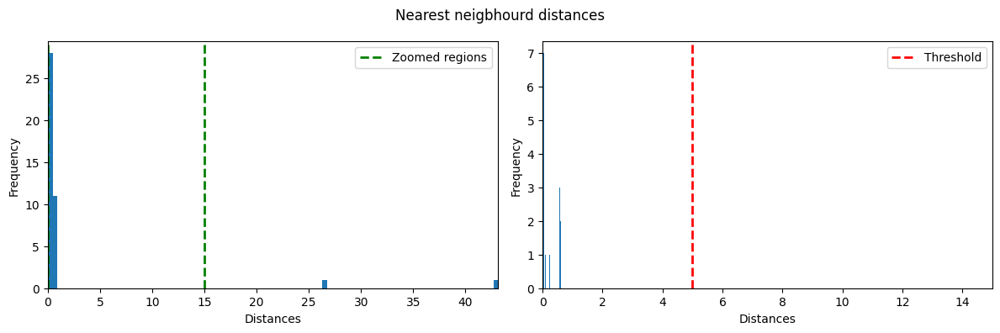

In [40]:
log_gt_pairing_dist = log_gt_pairing_df["dist"]
log_pairing_threshold = 5
visualization.plot_zoomed_histogram(log_gt_pairing_dist, zooming_threshold = 15, threshold = log_pairing_threshold, title = "Nearest neigbhourd distances", unit = "Distances")

We can verify the spots with the high distances.

In [41]:
log_verif_needed = False
if log_verif_needed:
    dog_idx, gt_idx  = log_gt_pairing_df[log_gt_pairing_df["dist"] > 10][log_gt_pairing_df["dist"] < 15][["log_idx", "gt_idx"]].values.flatten()
    log_detection_coord = blobs_log_df.loc[dog_idx, ["X", "Y"]].values.T.astype(int)
    gt_detection_coord = gt_cs_center_time_slice.loc[gt_idx, ["X", "Y"]].values.T.astype(int)

    utils.plot_comparison_spots_detection(coord1 = log_detection_coord,
                                coord2 = gt_detection_coord,
                                    label1 = "Log",
                                    label2 = "GT",
                                    img = frame_slice_zmax[1]
        )

This 2 shouldn't be paired toghether.

In [42]:
log_TP_idx = log_gt_pairing_df[log_gt_pairing_df["dist"] < log_pairing_threshold].index
log_TP = len(log_TP_idx)
log_FP = abs(len(blobs_log_df) - log_TP)
log_FN = len(gt_cs_center_time_slice) - log_TP

log_precision = log_TP / (log_TP + log_FP) if (log_TP + log_FP) > 0 else 0
log_recall = log_TP / (log_TP + log_FN) if (log_TP + log_FN) > 0 else 0
log_f1_score = 2 * (log_precision * log_recall) / (log_precision + log_recall) if (log_precision + log_recall) > 0 else 0

print(f"Number of True Positives: {log_TP}")
print(f"Number of False Positives: {log_FP}")
print(f"Number of False Negatives: {log_FN}")
print(f"Precision of stardist detection: {log_precision*100:.2f}")
print(f"Recall of stardist detection: {log_recall*100:.2f}")
print(f"F1-score of stardist detection: {log_f1_score*100:.2f}")

Number of True Positives: 39
Number of False Positives: 2
Number of False Negatives: 5
Precision of stardist detection: 95.12
Recall of stardist detection: 88.64
F1-score of stardist detection: 91.76


Log reports very good performance. 

#### Difference of Gaussian (DoG)

##### Implementation 
The parameters of the function have been optimized to results in the highest f1-score.

In [ ]:
blobs_dog = blob_dog(cs_frame_slice, min_sigma =0.7, max_sigma=5, threshold=0.3)

In [136]:
blobs_dog_df = pd.DataFrame(blobs_dog, columns=["Z", "Y", "X", "R"])
# Changes the values from pixel to microns
blobs_dog_df[["Rum"]] = blobs_dog_df[["R"]]*WIDTH_RESOLUTION
blobs_dog_df[["Yum","Xum"]] = blobs_dog_df[["Y","X"]]*WIDTH_RESOLUTION
blobs_dog_df[["Zum"]] = blobs_dog_df[["Z"]]*DEPTH_RESOLUTION

blobs_dog_df = blobs_dog_df.reset_index()
print(f"{len(blobs_dog_df)}/{len(gt_cs_center_time_slice)} spots detected with Dog detector")

40/44 spots detected with Dog detector


##### Results

Text(0.5, 0.98, 'Comparision of manual vs Dog detection')

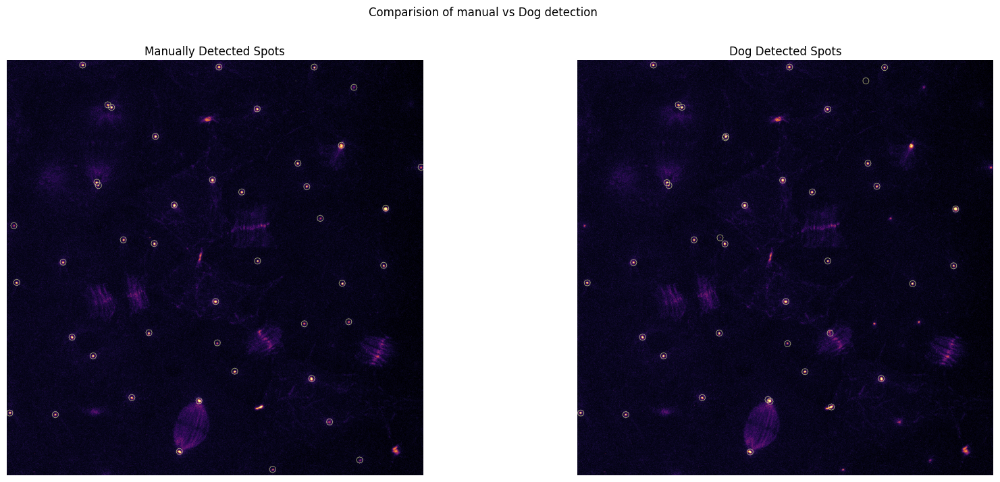

In [137]:
dog_cs_frame_slice_detection = visualization.draw_circles(cs_frame_slice, blobs_dog_df[["Z","Y","X"]].values)

dog_cs_frame_slice_detection_zmax = np.max(dog_cs_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_cs_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(dog_cs_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Dog Detected Spots")
axes[1].axis("off")
fig.suptitle("Comparision of manual vs Dog detection")

Visually Dog seems to provide very good detection missing only the spots with low intensity which should be more easily detected when having the rest of the dataset.
Some very wide and big spots have been detected but aren't in the ground truth. Dog returns radius of the detected elements, which allows us to remove the spots with a radius bigger than what we want. 

In [46]:
dog_radius = blobs_dog_df["Rum"]

blobs_dog_df.groupby("Rum").index.count()

Rum
0.105937     6
0.169498    32
0.271198     3
Name: index, dtype: int64

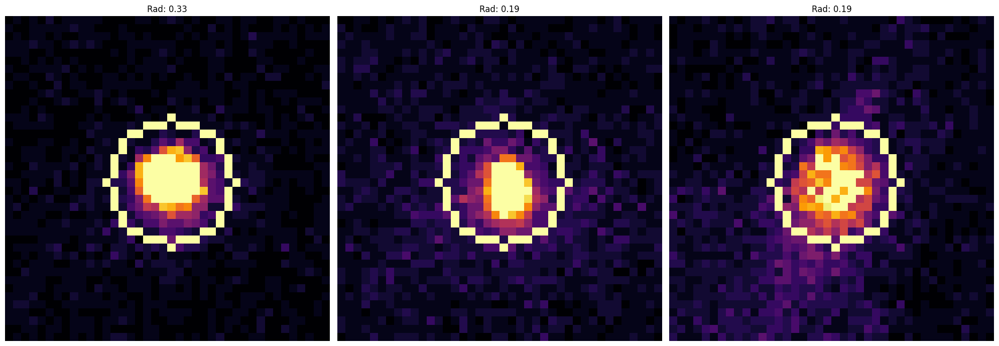

In [47]:
dog_idx_large_size = blobs_dog_df[blobs_dog_df["Rum"] > 0.2].index

dog_points = blobs_dog_df.iloc[dog_idx_large_size][["Z","Y","X"]].values.astype(int)
visualization.plot_points_closeup(stack = dog_cs_frame_slice_detection,points = dog_points,radius = blobs_log_df["Rum"].iloc[dog_idx_large_size].values)

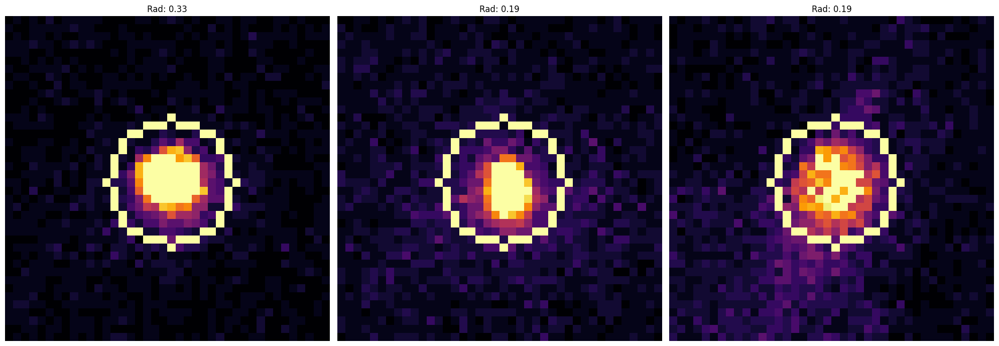

In [48]:
dog_idx_large_size = blobs_dog_df[blobs_dog_df["Rum"] > 0.2].index
dog_points = blobs_dog_df.iloc[dog_idx_large_size][["Z","Y","X"]].values.astype(int)

visualization.plot_points_closeup(stack = dog_cs_frame_slice_detection,points = dog_points,radius = blobs_log_df["Rum"].iloc[dog_idx_large_size].values)

In [49]:
dog_dist_matrix = distance_matrix(blobs_dog_df[["Zum","Yum","Xum"]].values,gt_cs_center_time_slice[["Zum","Yum","Xum"]].values)

dog_opti_row, dog_opti_col = linear_sum_assignment(dog_dist_matrix)

dog_gt_pairing_df = pd.DataFrame({
    "dog_idx": dog_opti_row.astype(int),
    "gt_idx": dog_opti_col.astype(int),
    "dist": dog_dist_matrix[dog_opti_row, dog_opti_col]
})

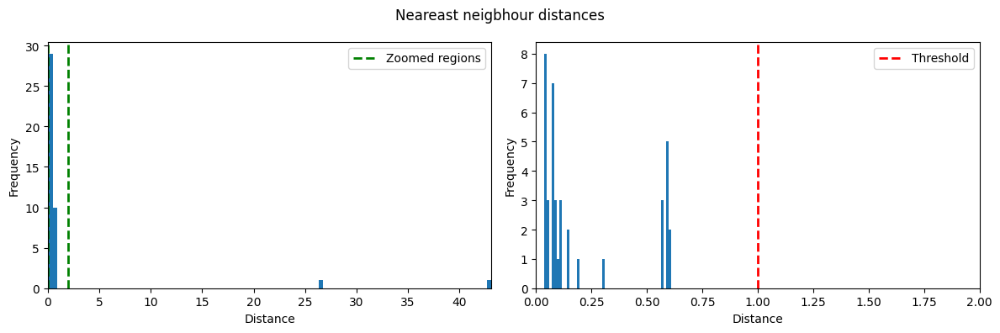

In [50]:
dog_gt_pairing_dist = dog_gt_pairing_df["dist"]
dog_pairing_distance_threshold = 1
visualization.plot_zoomed_histogram(dog_gt_pairing_dist, zooming_threshold = 2, threshold = dog_pairing_distance_threshold, title = "Neareast neigbhour distances", unit = "Distance")

Let's invastigate if the spots of distance ~5 and ~6 should be removed or not. 

2567586171.py (3): Boolean Series key will be reindexed to match DataFrame index.


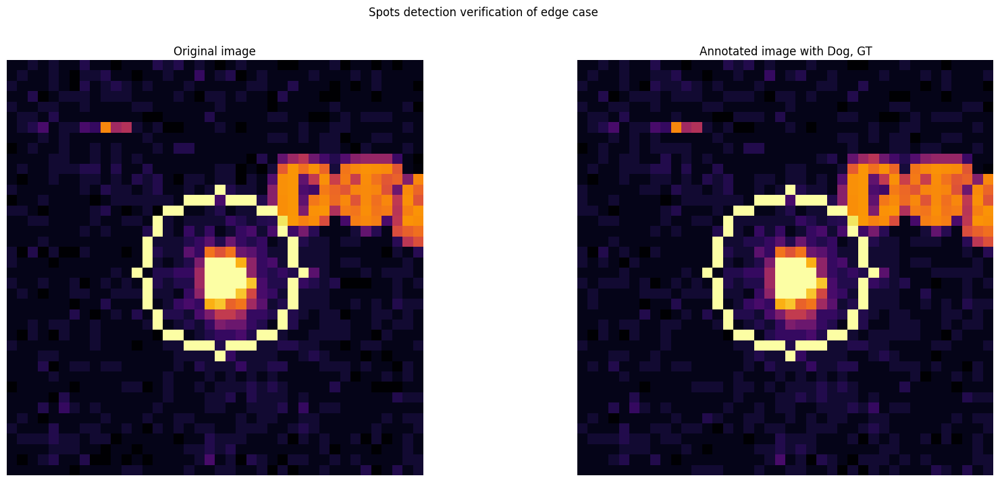

In [51]:
dog_verif = True
if dog_verif:
    dog_idx, gt_idx  = dog_gt_pairing_df[dog_gt_pairing_df["dist"] > 0.5][dog_gt_pairing_df["dist"] < 1][["dog_idx", "gt_idx"]].iloc[0].values.flatten()
    dog_coord = blobs_dog_df.loc[dog_idx, ["Z","Y","X"]].values.T.astype(int)
    gt_coord = gt_cs_center_time_slice.loc[gt_idx, ["Slice","Y","X"]].values.T.astype(int)


    visualization.plot_points_comparison(stack = cs_frame_slice,
                                      points = [dog_coord, gt_coord],
                                      labels = ["Dog","GT"]
        )

Good enough.
Now we can also verify that the z-axis estimation are rougly correct.

Good enough.

In [52]:
dog_TP_idx = dog_gt_pairing_df[dog_gt_pairing_df["dist"] < dog_pairing_distance_threshold].index
dog_TP = len(dog_TP_idx)
dog_FP = abs(len(blobs_dog_df) - dog_TP)
dog_FN = len(gt_cs_center_time_slice) - dog_TP

dog_precision = dog_TP / (dog_TP + dog_FP) if (dog_TP + dog_FP) > 0 else 0
dog_recall = dog_TP / (dog_TP + dog_FN) if (dog_TP + dog_FN) > 0 else 0
dog_f1_score = 2 * (dog_precision * dog_recall) / (dog_precision + dog_recall) if (dog_precision + dog_recall) > 0 else 0

print(f"Number of True Positives: {dog_TP}")
print(f"Number of False Positives: {dog_FP}")
print(f"Number of False Negatives: {dog_FN}")
print(f"Precision of stardist detection: {dog_precision*100:.2f}")
print(f"Recall of stardist detection: {dog_recall*100:.2f}")
print(f"F1-score of stardist detection: {dog_f1_score*100:.2f}")

Number of True Positives: 39
Number of False Positives: 2
Number of False Negatives: 5
Precision of stardist detection: 95.12
Recall of stardist detection: 88.64
F1-score of stardist detection: 91.76


The Log algorithm detected all the points correctly, while beeing faster than the 2 last options. We are thus going to use this algorithm to detected the spots centers. 


##### Thresholding optimization

For this optimization, we can allow more spots detecting by lowering the threshold, as we are going to remove manually the too large elements.

In [186]:
thresh_blobs_dog = blob_dog(cs_frame_slice, min_sigma =1, max_sigma=5, threshold=0.2)

In [187]:
thresh_blobs_dog_df = pd.DataFrame(thresh_blobs_dog, columns=["Z", "Y", "X", "R"])
# Changes the values from pixel to microns
thresh_blobs_dog_df[["Rum"]] = thresh_blobs_dog_df[["R"]]*np.mean([WIDTH_RESOLUTION, DEPTH_RESOLUTION])
thresh_blobs_dog_df[["Yum","Xum"]] = thresh_blobs_dog_df[["Y","X"]]*WIDTH_RESOLUTION
thresh_blobs_dog_df[["Zum"]] = thresh_blobs_dog_df[["Z"]]*DEPTH_RESOLUTION
thresh_blobs_dog_df = thresh_blobs_dog_df.reset_index()
print(f"{len(thresh_blobs_dog_df)}/{len(gt_cs_center_time_slice)} spots detected with Dog detector")

52/44 spots detected with Dog detector


Text(0.5, 0.98, 'Comparision of manual vs Dog detection')

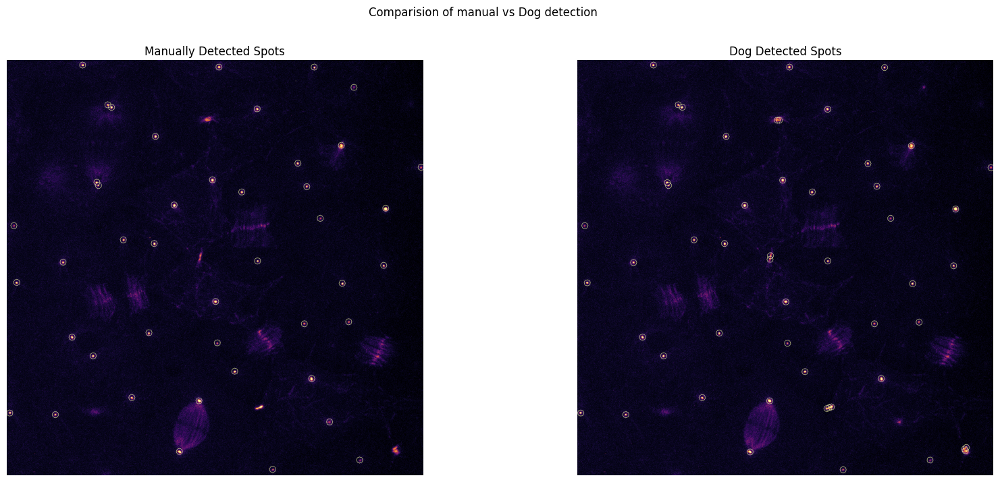

In [188]:
thresh_dog_cs_frame_slice_detection = visualization.draw_circles(cs_frame_slice, thresh_blobs_dog_df[["Z","Y","X"]].values)

thresh_dog_cs_frame_slice_detection_zmax = np.max(thresh_dog_cs_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_cs_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(thresh_dog_cs_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Dog Detected Spots")
axes[1].axis("off")
fig.suptitle("Comparision of manual vs Dog detection")

In [189]:
thresh_blobs_dog_df.groupby("Rum").count()

,index,Z,Y,X,R,Yum,Xum,Zum
Rum,,,,,,,,
0.359864,36,36,36,36,36,36,36,36
0.575782,14,14,14,14,14,14,14,14
0.921252,2,2,2,2,2,2,2,2


As planned the large elements are detected but we were also able to detecte some smaller one that get missed before. 

In [190]:
# Take all the unique zframe
zframes_detected = np.unique(thresh_blobs_dog[:,0]).astype(int)
curated_blob_center = thresh_blobs_dog.copy()

keep_mask = np.ones(len(thresh_blobs_dog), dtype=bool)

for z in zframes_detected:

    thresh_yen = threshold_yen(cs_frame_slice[z])
    thresh_yen_img = cs_frame_slice[z] > thresh_yen
    img_labels = ski.measure.label(thresh_yen_img)
    large_obj = ski.morphology.remove_small_objects(img_labels, min_size=areas_theshold/(WIDTH_RESOLUTION**2)) != 0
    z_indices = np.where(thresh_blobs_dog[:,0] == z)[0]
    
    for idx in z_indices:
        y, x = thresh_blobs_dog[idx][1:3].astype(int)

        if(large_obj[y,x]):
            keep_mask[idx] = False  

thresh_blobs_dog = curated_blob_center[keep_mask]

thresh_blobs_dog_df = pd.DataFrame(thresh_blobs_dog, columns=["Z", "Y", "X", "R"])
thresh_blobs_dog_df[["Rum"]] = thresh_blobs_dog_df[["R"]]*WIDTH_RESOLUTION
thresh_blobs_dog_df[["Yum","Xum"]] = thresh_blobs_dog_df[["Y","X"]]*WIDTH_RESOLUTION
thresh_blobs_dog_df[["Zum"]] = thresh_blobs_dog_df[["Z"]]*DEPTH_RESOLUTION
thresh_blobs_dog_df = thresh_blobs_dog_df.reset_index()

In [191]:
print(f" Number of poitns detected after large element removal: {len(thresh_blobs_dog_df.index)}/{len(gt_cs_center_time_slice)}")

 Number of poitns detected after large element removal: 43/44


Text(0.5, 0.98, 'Comparision of manual vs Dog detection')

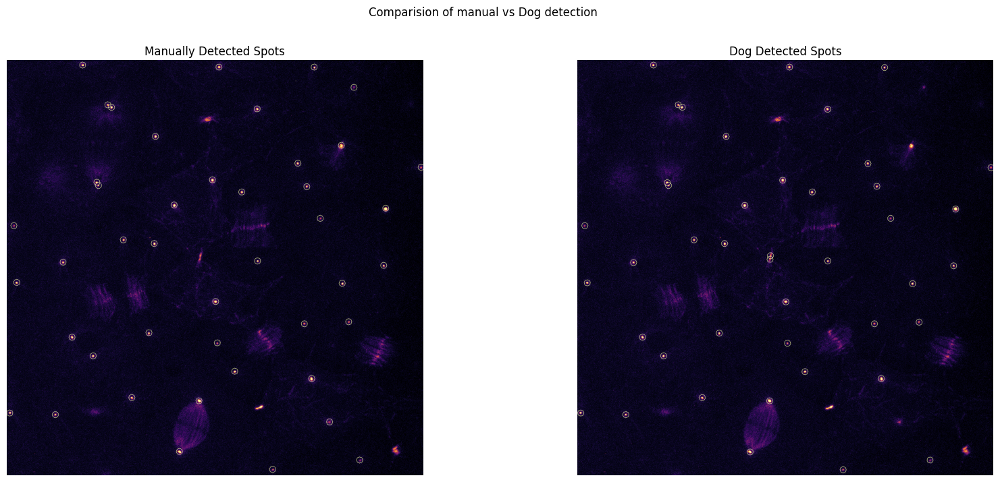

In [192]:
dog_cs_frame_slice_detection = visualization.draw_circles(cs_frame_slice, thresh_blobs_dog_df[["Z","Y","X"]].values)

dog_cs_frame_slice_detection_zmax = np.max(dog_cs_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_cs_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(dog_cs_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Dog Detected Spots")
axes[1].axis("off")
fig.suptitle("Comparision of manual vs Dog detection")

In [60]:
tifffile.imwrite(
    r"K:\users\voland\images\cova_data\ZF_colocalisation\4-6hpf_CetnGFP_CS\results\ground_truth\C1_annotated_ground_truth.tif",
    gt_cs_time_slice_detection,
    imagej= True
    )

We can now see that the large structures have been removed

In [61]:
thresh_dog_dist_matrix = distance_matrix(thresh_blobs_dog_df[["Zum","Yum","Xum"]].values,gt_cs_center_time_slice[["Zum","Yum","Xum"]].values)

thresh_dog_opti_row, thresh_dog_opti_col = linear_sum_assignment(thresh_dog_dist_matrix)

thresh_dog_gt_pairing_df = pd.DataFrame({
    "dog_idx": thresh_dog_opti_row.astype(int),
    "gt_idx": thresh_dog_opti_col.astype(int),
    "dist": thresh_dog_dist_matrix[thresh_dog_opti_row, thresh_dog_opti_col]
})

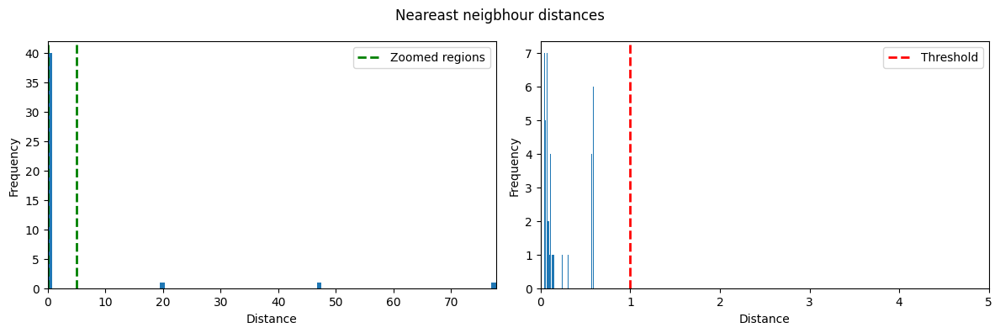

In [62]:
thresh_dog_gt_pairing_dist = thresh_dog_gt_pairing_df["dist"]
thresh_dog_pairing_distance_threshold = 1
visualization.plot_zoomed_histogram(thresh_dog_gt_pairing_dist, zooming_threshold = 5, threshold = thresh_dog_pairing_distance_threshold, title = "Neareast neigbhour distances", unit = "Distance")

In [63]:
thresh_dog_TP_idx = thresh_dog_gt_pairing_df[thresh_dog_gt_pairing_df["dist"] < thresh_dog_pairing_distance_threshold].index
thresh_dog_TP = len(thresh_dog_TP_idx)
thresh_dog_FP = abs(len(thresh_blobs_dog_df) - thresh_dog_TP)
thresh_dog_FN = len(gt_cs_center_time_slice) - thresh_dog_TP

thresh_dog_precision = thresh_dog_TP / (thresh_dog_TP + thresh_dog_FP) if (thresh_dog_TP + thresh_dog_FP) > 0 else 0
thresh_dog_recall = thresh_dog_TP / (thresh_dog_TP + thresh_dog_FN) if (thresh_dog_TP + thresh_dog_FN) > 0 else 0
thresh_dog_f1_score = 2 * (thresh_dog_precision * thresh_dog_recall) / (thresh_dog_precision + thresh_dog_recall) if (thresh_dog_precision + thresh_dog_recall) > 0 else 0

print(f"Number of True Positives: {thresh_dog_TP}")
print(f"Number of False Positives: {thresh_dog_FP}")
print(f"Number of False Negatives: {thresh_dog_FN}")
print(f"Precision of stardist detection: {thresh_dog_precision*100:.2f}")
print(f"Recall of stardist detection: {thresh_dog_recall*100:.2f}")
print(f"F1-score of stardist detection: {thresh_dog_f1_score*100:.2f}")

Number of True Positives: 40
Number of False Positives: 3
Number of False Negatives: 4
Precision of stardist detection: 93.02
Recall of stardist detection: 90.91
F1-score of stardist detection: 91.95


We can see that this version offer us the best performance and results so far.

##### Cetn2 channel optimization
The channel 1 parameters have already been optimized but not the channel 0 parameters. 
Let's process the same way and optimize C0 parameters.

In [64]:
C = 1
ct_frame_slice = frame_slice[:, 0]
print(f"Image shape: {cs_frame_slice.shape}")
print(f"Min value: {cs_frame_slice.min()}")
print(f"Max value: {cs_frame_slice.max()}")
print(f"Mean value: {cs_frame_slice.mean():.1f}")

Image shape: (11, 1024, 1024)
Min value: 0
Max value: 255
Mean value: 2.8


In [65]:
gt_ct_center_time_slice = pd.read_csv(GT_C0_LOW_THRESH_CENTER_COORD_Z14_22_T3_PATH)
gt_ct_center_time_slice.rename(columns={" ": "index"}, inplace=True)
gt_ct_center_time_slice["index"] = gt_ct_center_time_slice["index"] -1
gt_ct_center_time_slice["Slice"] = gt_ct_center_time_slice["Slice"] - 1

print(f"Number of spots manually detected : {len(gt_ct_center_time_slice)}")
gt_ct_center_time_slice.head()

Number of spots manually detected : 101


,index,X,Y,Slice
0,0,181.25,7.250,3
1,1,227.00,120.000,3
2,2,243.75,110.250,6
3,3,258.75,107.500,6
4,4,364.50,187.167,5


In [66]:
gt_ct_center_time_slice[["Yum","Xum"]] = gt_ct_center_time_slice[["Y","X"]]*WIDTH_RESOLUTION
gt_ct_center_time_slice[["Zum"]] = gt_ct_center_time_slice[["Slice"]]*DEPTH_RESOLUTION

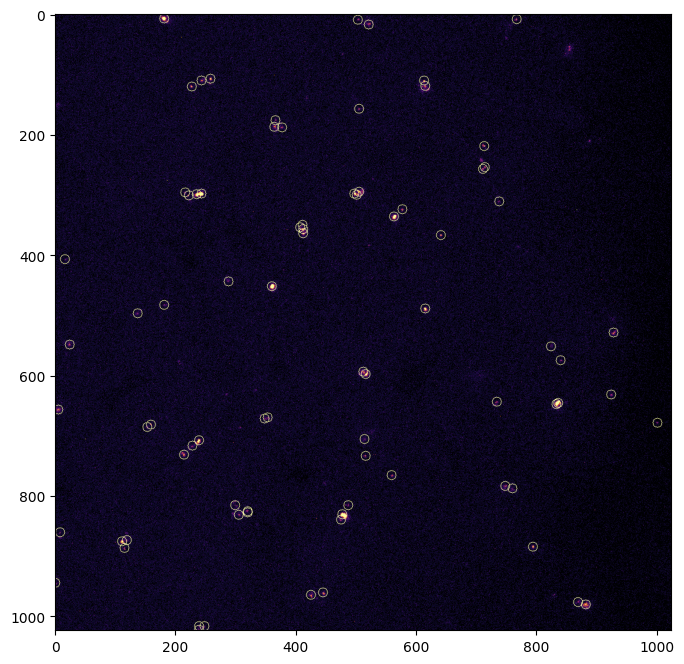

In [67]:
gt_ct_time_slice_detection = visualization.draw_circles(ct_frame_slice, gt_ct_center_time_slice[["Slice", "Y", "X"]].values)
gt_ct_time_slice_detection_zmax = np.max(gt_ct_time_slice_detection, axis=0)
plt.figure(figsize = (8,8))
plt.imshow(gt_ct_time_slice_detection_zmax, cmap="inferno")

In [68]:
tifffile.imwrite(
    r"K:\users\voland\images\cova_data\ZF_colocalisation\4-6hpf_CetnGFP_CS\results\ground_truth\C0_annotated_ground_truth.tif",
    gt_ct_time_slice_detection,
    imagej= True,
    metadata={'axes': 'TYX'}
    )

Let's call the algo now

In [69]:
ct_blobs_dog = blob_dog(ct_frame_slice, min_sigma=1, max_sigma=3, threshold=0.08)

In [70]:
ct_blobs_dog_df = pd.DataFrame(ct_blobs_dog, columns=["Z", "Y", "X", "R"])
# Changes the values from pixel to microns
ct_blobs_dog_df[["Rum"]] = ct_blobs_dog_df[["R"]]*WIDTH_RESOLUTION
ct_blobs_dog_df[["Yum","Xum"]] = ct_blobs_dog_df[["Y","X"]]*WIDTH_RESOLUTION
ct_blobs_dog_df[["Zum"]] = ct_blobs_dog_df[["Z"]]*DEPTH_RESOLUTION
ct_blobs_dog_df = ct_blobs_dog_df.reset_index()
print(f"{len(ct_blobs_dog_df)}\{len(gt_ct_center_time_slice)} spots detected with Dog detector")

103\101 spots detected with Dog detector


Text(0.5, 0.98, 'Comparision of manual vs Dog detection')

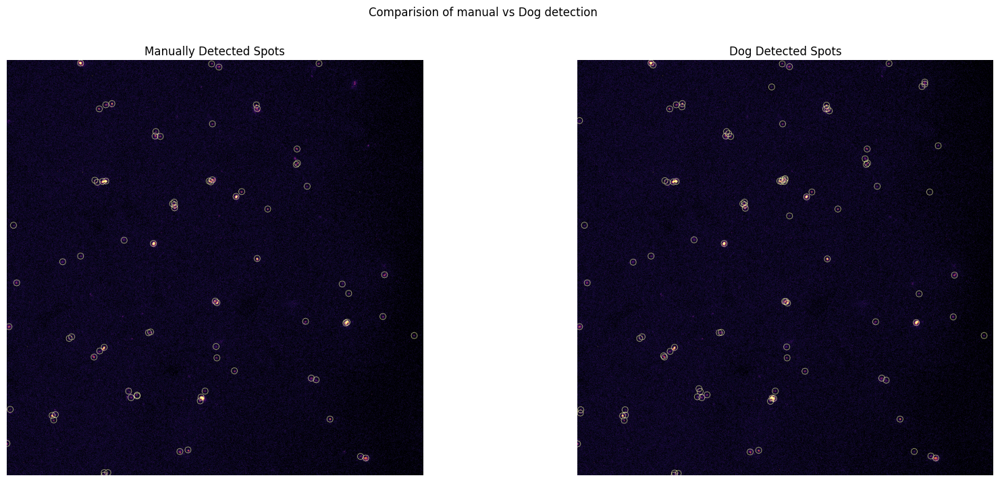

In [71]:
dog_ct_frame_slice_detection = visualization.draw_circles(ct_frame_slice, ct_blobs_dog_df[["Z","Y","X"]].values)

dog_ct_frame_slice_detection_zmax = np.max(dog_ct_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_ct_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(dog_ct_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Dog Detected Spots")
axes[1].axis("off")

fig.suptitle("Comparision of manual vs Dog detection")

In [72]:
ct_blobs_dog_df.groupby("Rum").index.count()

Rum
0.151338    96
0.242141     7
Name: index, dtype: int64

In [73]:
ct_dog_dist_matrix = distance_matrix(ct_blobs_dog_df[["Zum","Yum","Xum"]].values,gt_ct_center_time_slice[["Zum","Yum","Xum"]].values)

ct_dog_opti_row, ct_dog_opti_col = linear_sum_assignment(ct_dog_dist_matrix)

ct_dog_gt_pairing_df = pd.DataFrame({
    "dog_idx": ct_dog_opti_row.astype(int),
    "gt_idx": ct_dog_opti_col.astype(int),
    "dist": ct_dog_dist_matrix[ct_dog_opti_row, ct_dog_opti_col]
})

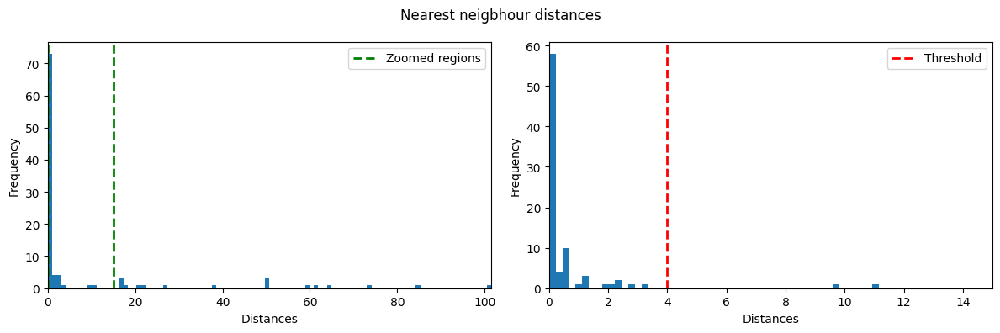

In [74]:
ct_dog_gt_pairing_dist = ct_dog_gt_pairing_df["dist"]
ct_dog_pairing_distance_threshold = 4
visualization.plot_zoomed_histogram(ct_dog_gt_pairing_dist, zooming_threshold = 15, threshold = ct_dog_pairing_distance_threshold, title ="Nearest neigbhour distances",unit = "Distances")

In [75]:
ct_dog_TP_idx = ct_dog_gt_pairing_df[ct_dog_gt_pairing_df["dist"] < ct_dog_pairing_distance_threshold].index
ct_dog_TP = len(ct_dog_TP_idx)
ct_dog_FP = abs(len(ct_blobs_dog_df) - ct_dog_TP)
ct_dog_FN = len(gt_ct_center_time_slice) - ct_dog_TP

ct_dog_precision = ct_dog_TP / (ct_dog_TP + ct_dog_FP) if (ct_dog_TP + ct_dog_FP) > 0 else 0
ct_dog_recall = ct_dog_TP / (ct_dog_TP + ct_dog_FN) if (ct_dog_TP + ct_dog_FN) > 0 else 0
ct_dog_f1_score = 2 * (ct_dog_precision * ct_dog_recall) / (ct_dog_precision + ct_dog_recall) if (ct_dog_precision + ct_dog_recall) > 0 else 0

print(f"Number of True Positives: {ct_dog_TP}")
print(f"Number of False Positives: {ct_dog_FP}")
print(f"Number of False Negatives: {ct_dog_FN}")
print(f"Precision of stardist detection: {ct_dog_precision*100:.2f}")
print(f"Recall of stardist detection: {ct_dog_recall*100:.2f}")
print(f"F1-score of stardist detection: {ct_dog_f1_score*100:.2f}")

Number of True Positives: 82
Number of False Positives: 21
Number of False Negatives: 19
Precision of stardist detection: 79.61
Recall of stardist detection: 81.19
F1-score of stardist detection: 80.39


## Colocalisation

As mentionned in the previous section, DoG alogrithm performed the best and was selected for further spots detections. 
Using command line (see `blob_detection_C0.bat` and `blob_detection_C1.bat`), I ran the `blob_detection.py`script for the entire dataset (only C0 and C1). This script call the `blob_dog` function for each images and save the results in a csv file. I ran this scripts and saved the data separately to allow us to directly load the results without needing to re-do the detection process every time we compile the notebook.
For the DoG algorithm I used the same parameters as the one found in the previous section.

In this next step we are going to associate CenSpark labeled centrioles with Cetn2 labled centrioles.

In [76]:
ct_center_df = pd.read_csv(C0_BLOB_CENTER_PATH)
ct_center_df

,index,T,Z,Y,X,R
0,0,0.0,29.0,994.0,863.0,1.120
1,1,0.0,48.0,294.0,941.0,1.792
2,2,0.0,32.0,826.0,729.0,1.792
3,3,0.0,26.0,998.0,889.0,1.792
4,4,0.0,45.0,541.0,751.0,1.120
...,...,...,...,...,...,...
1242,1242,6.0,68.0,0.0,890.0,0.700
1243,1243,6.0,58.0,355.0,747.0,0.700
1244,1244,6.0,67.0,220.0,838.0,0.700
1245,1245,6.0,66.0,0.0,894.0,0.700


In [77]:
cs_center_df = pd.read_csv(C1_BLOB_CENTER_PATH)
cs_center_df

,index,T,Z,Y,X,R
0,0,0.0,28.0,74.0,851.0,1.0
1,1,0.0,24.0,22.0,512.0,1.0
2,2,0.0,47.0,82.0,875.0,1.0
3,3,0.0,45.0,786.0,609.0,1.0
4,4,0.0,20.0,155.0,597.0,1.0
...,...,...,...,...,...,...
1374,1374,6.0,53.0,32.0,151.0,1.0
1375,1375,6.0,47.0,781.0,11.0,1.0
1376,1376,6.0,62.0,111.0,540.0,1.0
1377,1377,6.0,62.0,399.0,496.0,1.0


Let's now convert the coordinate in microns to properly calculate the distance.

In [78]:
ct_center_df[["Yum","Xum"]] = ct_center_df[["Y","X"]]*WIDTH_RESOLUTION
ct_center_df[["Zum"]] = ct_center_df[["Z"]]*DEPTH_RESOLUTION
ct_center_df[["Rum"]] = ct_center_df[["R"]]*WIDTH_RESOLUTION

cs_center_df[["Yum","Xum"]] = cs_center_df[["Y","X"]]*WIDTH_RESOLUTION
cs_center_df[["Zum"]] = cs_center_df[["Z"]]*DEPTH_RESOLUTION  
cs_center_df[["Rum"]] = cs_center_df[["R"]]*WIDTH_RESOLUTION

ct_center_df

,index,T,Z,Y,X,R,Yum,Xum,Zum,Rum
0,0,0.0,29.0,994.0,863.0,1.120,150.429863,130.604600,16.48331,0.169498
1,1,0.0,48.0,294.0,941.0,1.792,44.493340,142.408955,27.28272,0.271198
2,2,0.0,32.0,826.0,729.0,1.792,125.005098,110.325322,18.18848,0.271198
3,3,0.0,26.0,998.0,889.0,1.792,151.035215,134.539385,14.77814,0.271198
4,4,0.0,45.0,541.0,751.0,1.120,81.873799,113.654756,25.57755,0.169498
...,...,...,...,...,...,...,...,...,...,...
1242,1242,6.0,68.0,0.0,890.0,0.700,0.000000,134.690723,38.65052,0.105937
1243,1243,6.0,58.0,355.0,747.0,0.700,53.724951,113.049404,32.96662,0.105937
1244,1244,6.0,67.0,220.0,838.0,0.700,33.294336,126.821152,38.08213,0.105937
1245,1245,6.0,66.0,0.0,894.0,0.700,0.000000,135.296074,37.51374,0.105937


We can first notice that there are more spots detected from the channel 0 (Cetn2) than the channel 1 (CenSpark) but that globally we have a very similar number of spots detected which is reasurring.

We aren't really interested by the distances between all the labeled centriole. We are rather interest by their nearest neighbours, their minial distance. Indeed we want to match CenSpark with Cetn2 labeled centrioles. Thus for each point we must deteRumne its closest neighbours, if any close enough.

### Assignment problem solving 
Finding the most optimal pairs is an assignment problem and multiple already implemented exist to solve it. 
We decided to use [scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.linear_sum_assignment.html) `linear_sum_assigment` function.

Let's also recall that we should get the distance matrix and the optimal pairs for each frame of our dataset.

In [79]:
results = []

for frame in range(FRAMES):
    # We should work frame by frame as colocalisation only makes sense for the same temporality
    ct_center_df_t = ct_center_df[ct_center_df["T"] == frame]
    cs_center_df_t = cs_center_df[cs_center_df["T"] == frame]

    ct_pos = ct_center_df_t[["Zum","Yum", "Xum"]].values
    cs_pos = cs_center_df_t[["Zum", "Yum","Xum"]].values

    dist_matrix = distance_matrix(ct_pos,cs_pos)

    opti_row, opti_col = linear_sum_assignment(dist_matrix) #, distances = match_with_kdtree(ct_pos, cs_pos, max_distance=300)

    results.append(pd.DataFrame({
        "CT_idx": ct_center_df_t.index[opti_row],
        "CS_idx": cs_center_df_t.index[opti_col],
        "dist": dist_matrix[opti_row,opti_col],
        "T" : frame
    }))

initial_pair_df = pd.concat(results, ignore_index=True) if results else pd.DataFrame()


In [80]:
initial_pair_dist = initial_pair_df["dist"]
print("Nearest neighbour  between CenSark and Cetn2")
print(f"Number of CenSpark & Cetn2 labeled spots: {len(initial_pair_dist)}")
print(f"Min distance: {initial_pair_dist.min():.2f}")
print(f"Max distance: {initial_pair_dist.max():.2f}")
print(f"Mean distance: {initial_pair_dist.mean():.2f}")
print(f"Median distance: {np.median(initial_pair_dist)}")

Nearest neighbour  between CenSark and Cetn2
Number of CenSpark & Cetn2 labeled spots: 1173
Min distance: 0.00
Max distance: 77.45
Mean distance: 8.98
Median distance: 2.627459279877049


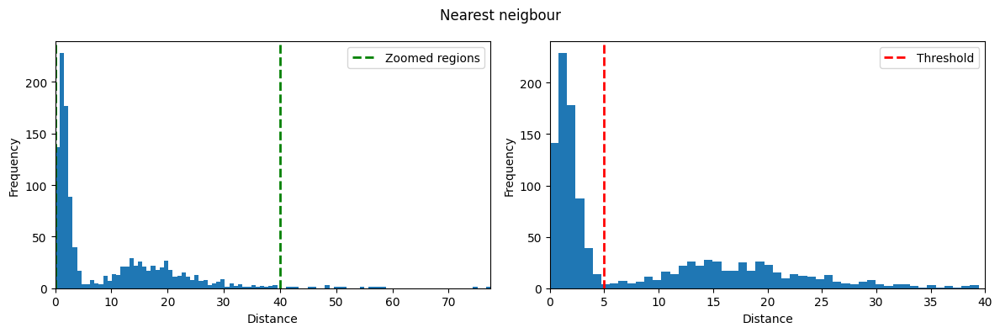

In [81]:
distance_threshold = 5
visualization.plot_zoomed_histogram(initial_pair_dist, zooming_threshold=40, threshold=distance_threshold, title = "Nearest neigbour", unit = "Distance")

We estimate that most centriole detected by CenSpark have a very close nearest neighbour that correspond to the Cetn2 label. Any largest distance most likely mean that the centriole is labeled correclty by only one marker. 
Let's zoom at the small distance in the graph to deteRumne this distance.

1607795793.py (3): Boolean Series key will be reindexed to match DataFrame index.


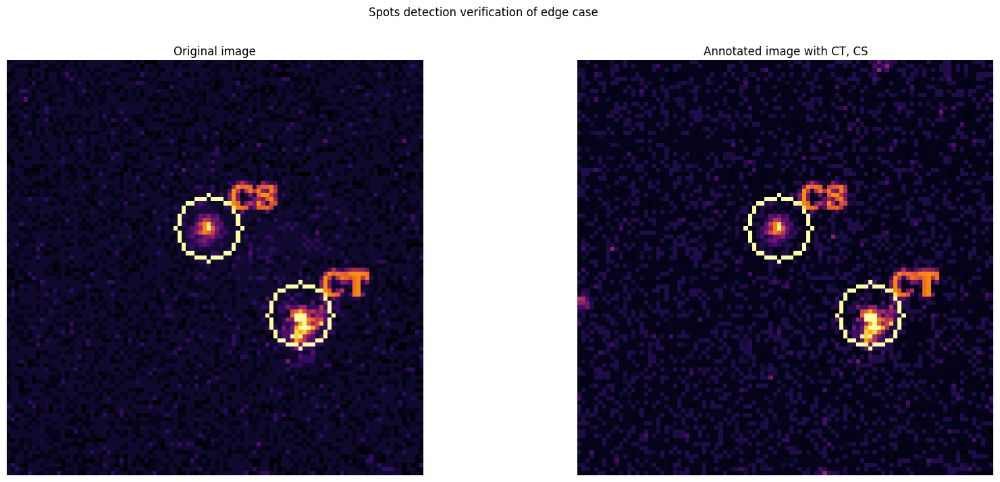

In [84]:
coloc_verif = True
if coloc_verif:
    ct_idx, cs_idx  = initial_pair_df[initial_pair_df["dist"] >5][initial_pair_df["dist"] < 6][["CT_idx", "CS_idx"]].values[0]

    ct_t = ct_center_df.loc[ct_idx, ["T"]].values[0]
    cs_t = cs_center_df.loc[cs_idx, ["T"]].values[0]
    assert(ct_t == cs_t)

    ct_coord = ct_center_df.loc[ct_idx, ["Z","Y", "X"]].values.T.astype(int)
    cs_coord = cs_center_df.loc[cs_idx, ["Z","Y", "X"]].values.T.astype(int)

    vol_ct_cs = np.max(vol[int(ct_t),:,0:2],axis=1)

    visualization.plot_points_comparison(stack = vol_ct_cs,
                                         points = [ct_coord, cs_coord],
                                         labels = ["CT","CS"],
                                         window_size = 100
    )

It seems that the majority of the closest nearest neighbour are located at a distance of approximately 1.5.
We must deteRumne the threshold which indicates the maximal distances between 2 labels before they mostly aren't related. Pair below this threshold are assumed to label the same centriole.
Let's first try with the value 13. We can now reuse our vector of nearest neibours and only keep the ones that are below this threshold. Spots removed from the vector are considered as spots without corresponding spot in the other channel.

Now that we have estimate a maximal distances thershold, let's reasign the pair focus only on the ones below the threshold. In practise this mean that we are going to focus the assigment algorithm only on the close enough points. 

In [85]:
results = []

for frame in range(FRAMES):
    # We should work frame by frame as colocalisation only makes sense for the same temporality
    ct_center_df_t = ct_center_df[ct_center_df["T"] == frame]
    cs_center_df_t = cs_center_df[cs_center_df["T"] == frame]

    ct_pos = ct_center_df_t[["Zum","Yum", "Xum"]].values
    cs_pos = cs_center_df_t[["Zum", "Yum","Xum"]].values

    dist_matrix = distance_matrix(ct_pos,cs_pos)

    # Optimize only the point that are close enough
    dist_mat_masked = dist_matrix.copy()
    dist_mat_masked[dist_matrix > distance_threshold] = 1e10   
    opti_row, opti_col = linear_sum_assignment(dist_mat_masked) #, distances = match_with_kdtree(ct_pos, cs_pos, max_distance=300)

    results.append(pd.DataFrame({
        "CT_idx": ct_center_df_t.index[opti_row],
        "CS_idx": cs_center_df_t.index[opti_col],
        "dist": dist_matrix[opti_row,opti_col],
        "T" : frame
    }))

pair_df = pd.concat(results, ignore_index=True) if results else pd.DataFrame()
label_pair_df = pair_df[pair_df["dist"] <= distance_threshold]


With such threshold, let's estimate what percentage of the centriole are paired. 

In [86]:
proportion_pair = len(label_pair_df['dist']) / len(initial_pair_df['dist']) * 100
print(f"Percentage of paired label: {proportion_pair}")

Percentage of paired label: 60.69906223358908


We can reuse the image with marker center labeled and add a number on top of the paired centers.

In [87]:
ct_center_vol = tifffile.imread(C0_BLOB_CENTER_IMG_PATH)
cs_center_vol = tifffile.imread(C1_BLOB_CENTER_IMG_PATH)

In [90]:
annotated_ct_center_vol = ct_center_vol.copy()
annotated_cs_center_vol = cs_center_vol.copy()

for frame in range(FRAMES):
    label_pair_df_t = label_pair_df[label_pair_df["T"] == frame]
    list_pair_idx = label_pair_df_t[["CT_idx","CS_idx"]].values
    for i in range(len(list_pair_idx)):
        idx_ct, idx_cs = list_pair_idx[i]

        visualization.add_text(annotated_ct_center_vol[frame,:,1],str(i), ct_center_df.iloc[idx_ct][["Z","Y","X"]].values)
        visualization.add_text(annotated_cs_center_vol[frame,:,1],str(i), cs_center_df.iloc[idx_cs][["Z","Y","X"]].values)

        
annotated_vol = np.concatenate((annotated_ct_center_vol, annotated_cs_center_vol), axis=2)

In [ ]:
tifffile.imwrite(PAIRING_MASK_OUTPUT_PATH, 
                annotated_vol,
                imagej=True,
                compression='zlib'
                )

### Results

We can now processed to the analysis of the paired labels.
We start by extracting the spots that have been paired and isolate the alone labels.

In [91]:
ct_paired_df = ct_center_df[ct_center_df["index"].isin(label_pair_df["CT_idx"])]
cs_paired_df = cs_center_df[cs_center_df["index"].isin(label_pair_df["CS_idx"])]

ct_unpaired_df = ct_center_df[~ct_center_df["index"].isin(label_pair_df["CT_idx"])]
cs_unpaired_df = cs_center_df[~cs_center_df["index"].isin(label_pair_df["CS_idx"])]

nb_tot_CT = len(ct_center_df.index)
nb_tot_CS = len(cs_center_df.index)

nb_paired_CT = len(ct_paired_df.index)
nb_paired_CS = len(cs_paired_df.index)
assert(nb_paired_CS == nb_paired_CT)

nb_unpaired_CT = len(ct_unpaired_df.index)
nb_unpaired_CS = len(cs_unpaired_df.index)

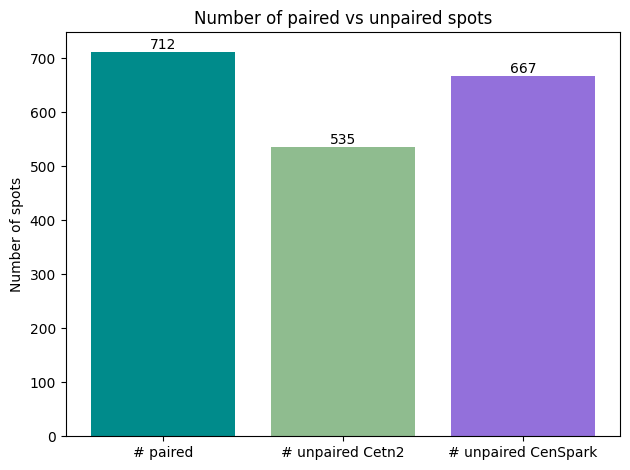

In [92]:
pairing_nb_labels = ["# paired", "# unpaired Cetn2", "# unpaired CenSpark"]
pairing_nb = [nb_paired_CS, nb_unpaired_CT, nb_unpaired_CS]
nb_colors = ['darkcyan', 'darkseagreen', 'mediumpurple']

fig, ax = plt.subplots()
bars = ax.bar(pairing_nb_labels, pairing_nb, color=nb_colors)

ax.set_ylabel("Number of spots")
ax.set_title("Number of paired vs unpaired spots")
ax.bar_label(bars, fontsize=10)

plt.tight_layout()
plt.show()

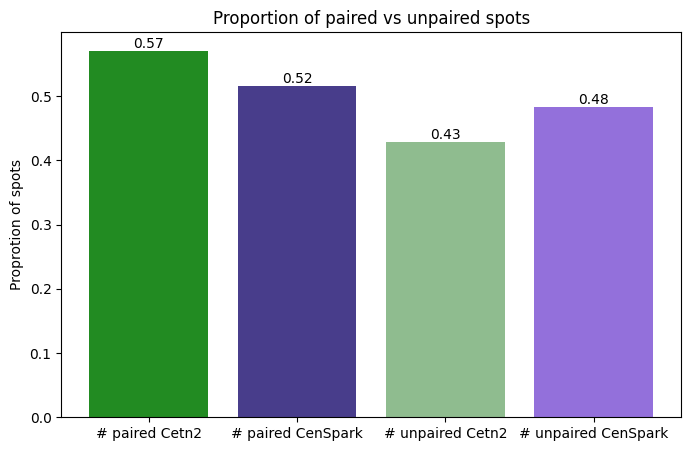

In [93]:
pairing_proportion_labels = ["# paired Cetn2", "# paired CenSpark", "# unpaired Cetn2", "# unpaired CenSpark"]
pairing_proportions = [nb_paired_CT/nb_tot_CT, nb_paired_CS/nb_tot_CS, nb_unpaired_CT/nb_tot_CT, nb_unpaired_CS/nb_tot_CS]
proportion_colors = ['forestgreen','darkslateblue', 'darkseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(8,5))
bars = ax.bar(pairing_proportion_labels, pairing_proportions, color=proportion_colors)

ax.set_ylabel("Proprotion of spots")
ax.set_title("Proportion of paired vs unpaired spots")
ax.bar_label(bars, fontsize=10,fmt='%.2f')
plt.show()

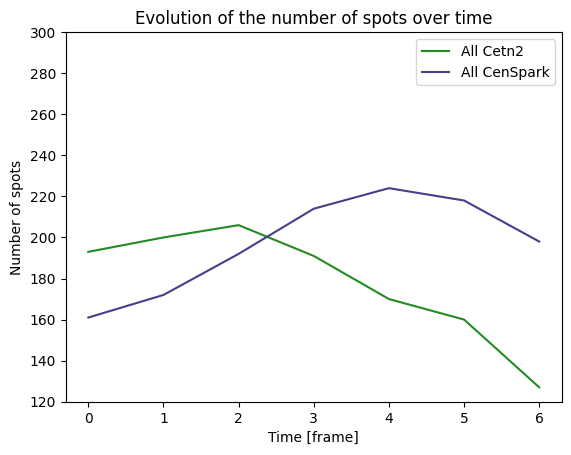

In [94]:
pairing_data = [ct_center_df, cs_center_df]
evolution_labels = ["All Cetn2", "All CenSpark"]
evolution_colors = ['forestgreen','darkslateblue']

for i in range(len(pairing_data)):
    count_over_time = pairing_data[i].groupby(["T"]).count()["index"].values
    plt.plot(count_over_time, label = evolution_labels[i], color = evolution_colors[i])

plt.title("Evolution of the number of spots over time")
plt.xlabel("Time [frame]")
plt.ylabel("Number of spots")
plt.ylim((120,300))
plt.legend()

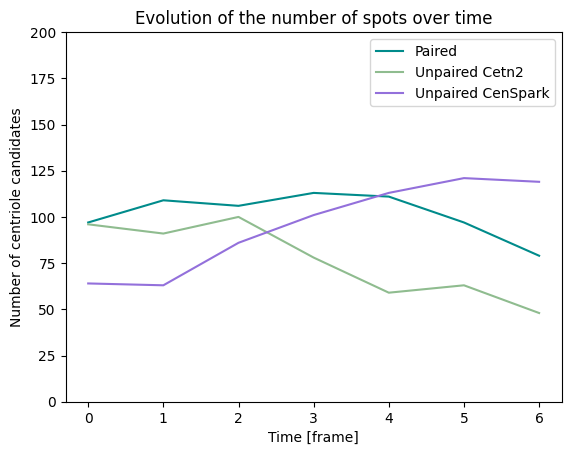

In [95]:
pairing_data = [ct_paired_df, ct_unpaired_df, cs_unpaired_df]
evolution_labels = ["Paired", "Unpaired Cetn2", "Unpaired CenSpark"]
evolution_colors = ['darkcyan', 'darkseagreen', 'mediumpurple']

for i in range(len(pairing_data)):
    count_over_time = pairing_data[i].groupby(["T"]).count()["index"].values
    plt.plot(count_over_time, label = evolution_labels[i], color = evolution_colors[i])

plt.title("Evolution of the number of spots over time")
plt.xlabel("Time [frame]")
plt.ylabel("Number of centriole candidates")
plt.ylim((0,200))
plt.legend()

### Lower threshold analysis 

We notice by looking at the images that a lot of Cetn2 labels are actually missed. 
Let's lower the threshold to capture more Cetn2 spots.

In [96]:
ct_blobs_dog = blob_dog(ct_frame_slice, min_sigma=1.5, max_sigma=3, threshold=0.06)

In [97]:
ct_blobs_dog_df = pd.DataFrame(ct_blobs_dog, columns=["Z", "Y", "X", "R"])
# Changes the values from pixel to microns
ct_blobs_dog_df[["Rum"]] = ct_blobs_dog_df[["R"]]*WIDTH_RESOLUTION
ct_blobs_dog_df[["Yum","Xum"]] = ct_blobs_dog_df[["Y","X"]]*WIDTH_RESOLUTION
ct_blobs_dog_df[["Zum"]] = ct_blobs_dog_df[["Z"]]*DEPTH_RESOLUTION
ct_blobs_dog_df = ct_blobs_dog_df.reset_index()
print(f"{len(ct_blobs_dog_df)}\{len(gt_ct_center_time_slice)} spots detected with Dog detector")

80\101 spots detected with Dog detector


Text(0.5, 0.98, 'Comparision of manual vs Dog detection')

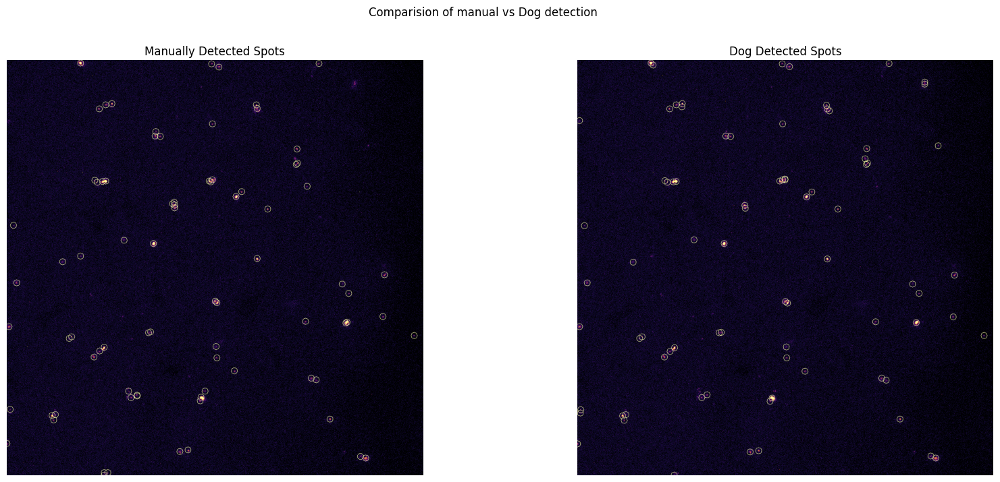

In [99]:
dog_ct_frame_slice_detection = visualization.draw_circles(ct_frame_slice, ct_blobs_dog_df[["Z","Y","X"]].values)

dog_ct_frame_slice_detection_zmax = np.max(dog_ct_frame_slice_detection, axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(gt_ct_time_slice_detection_zmax, cmap="inferno")
axes[0].set_title("Manually Detected Spots")
axes[0].axis("off")

axes[1].imshow(dog_ct_frame_slice_detection_zmax,cmap="inferno")
axes[1].set_title("Dog Detected Spots")
axes[1].axis("off")

fig.suptitle("Comparision of manual vs Dog detection")

With these new parameters, we can recompute our image and obtain new results. 

In [100]:
ct_low_center_vol = tifffile.imread(C0_LOW_THRESH_BLOB_CENTER_IMG_PATH)

In [101]:
ct_low_center_df = pd.read_csv(C0_LOW_THRESH_BLOB_CENTER_PATH)

ct_low_center_df[["Yum","Xum"]] = ct_low_center_df[["Y","X"]]*WIDTH_RESOLUTION
ct_low_center_df[["Zum"]] = ct_low_center_df[["Z"]]*DEPTH_RESOLUTION

print(f"Difference of Cetn2 spots detected with low compared to normal threshold: {len(ct_low_center_df.index) -len(ct_center_df.index)}")

Difference of Cetn2 spots detected with low compared to normal threshold: 1437


In [102]:
results = []

for frame in range(FRAMES):
    # We should work frame by frame as colocalisation only makes sense for the same temporality
    ct_low_center_df_t = ct_low_center_df[ct_low_center_df["T"] == frame]
    cs_center_df_t = cs_center_df[cs_center_df["T"] == frame]

    ct_pos = ct_low_center_df_t[["Zum","Yum", "Xum"]].values
    cs_pos = cs_center_df_t[["Zum", "Yum","Xum"]].values

    dist_matrix = distance_matrix(ct_pos,cs_pos)

    # Optimize only the point that are close enough
    dist_mat_masked = dist_matrix.copy()
    dist_mat_masked[dist_matrix > distance_threshold] = 1e10   
    opti_row, opti_col = linear_sum_assignment(dist_mat_masked) #, distances = match_with_kdtree(ct_pos, cs_pos, max_distance=300)

    results.append(pd.DataFrame({
        "CT_idx": ct_low_center_df_t.index[opti_row],
        "CS_idx": cs_center_df_t.index[opti_col],
        "dist": dist_matrix[opti_row,opti_col],
        "T" : frame
    }))

low_pair_df = pd.concat(results, ignore_index=True) if results else pd.DataFrame()
label_low_pair_df = low_pair_df[low_pair_df["dist"] <= distance_threshold]

In [104]:
annotated_ct_low_center_vol = ct_low_center_vol.copy()
annotated_cs_low_center_vol = cs_center_vol.copy()
for frame in range(FRAMES):
    label_low_pair_df_t = label_low_pair_df[label_low_pair_df["T"] == frame]
    list_low_pair_idx = label_low_pair_df_t[["CT_idx","CS_idx"]].values
    for i in range(len(list_low_pair_idx)):
        idx_ct, idx_cs = list_low_pair_idx[i]

        visualization.add_text(annotated_ct_low_center_vol[frame,:,1],str(i), ct_low_center_df.iloc[idx_ct][["Z","Y","X"]].values)
        visualization.add_text(annotated_cs_low_center_vol[frame,:,1],str(i), cs_center_df.iloc[idx_cs][["Z","Y","X"]].values)
        
low_annotated_vol = np.concatenate((annotated_ct_low_center_vol, annotated_cs_low_center_vol), axis=2)

In [105]:
t,z,c,y,x = vol.shape

pairing_centers_vol = np.empty((t,z,4,y,x), dtype = np.uint8)
for frame in range(FRAMES):
    label_low_pair_df_t = label_low_pair_df[label_low_pair_df["T"] == frame]

    idx_ct = label_low_pair_df_t[["CT_idx"]].values.flatten()
    idx_cs = label_low_pair_df_t[["CS_idx"]].values.flatten()

    mask_ct = visualization.create_circle_mask(ct_low_center_df.iloc[idx_ct][["Z","Y","X"]].values, [z,y,x])
    mask_cs = visualization.create_circle_mask(cs_center_df.iloc[idx_cs][["Z","Y","X"]].values,[z,y,x])

    pairing_centers_vol[frame] = np.stack([vol[frame,:,0], mask_ct, vol[frame,:,1],mask_cs], axis=1) 

We can save the results in an annotated image.

In [ ]:
tifffile.imwrite(LOW_PAIRING_MASK_OUTPUT_PATH, 
                pairing_centers_vol,
                imagej=True,
                compression='zlib'
                )

##### Results 

We can recreate the same plots as before and deteRumne how the data changed with a lower threshold

In [106]:
ct_low_paired_df = ct_low_center_df[ct_low_center_df["index"].isin(label_low_pair_df["CT_idx"])]
cs_low_paired_df = cs_center_df[cs_center_df["index"].isin(label_low_pair_df["CS_idx"])]

ct_low_unpaired_df = ct_low_center_df[~ct_low_center_df["index"].isin(label_low_pair_df["CT_idx"])]
cs_low_unpaired_df = cs_center_df[~cs_center_df["index"].isin(label_low_pair_df["CS_idx"])]

nb_tot_CT_low = len(ct_low_center_df.index)
nb_tot_CS_low = len(cs_center_df.index)

nb_paired_CT_low = len(ct_low_paired_df.index)
nb_paired_CS_low = len(cs_low_paired_df.index)
assert(nb_paired_CS_low == nb_paired_CT_low)

nb_unpaired_CT_low = len(ct_low_unpaired_df.index)
nb_unpaired_CS_low = len(cs_low_unpaired_df.index)

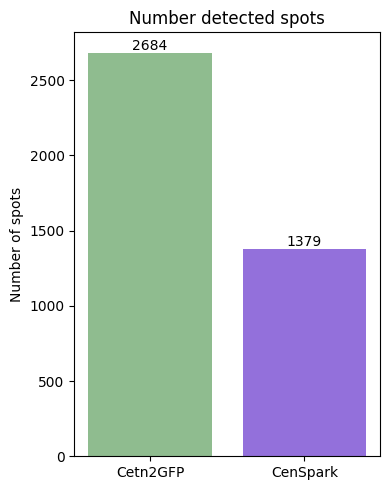

In [107]:
markers_nb_labels = ["Cetn2GFP", "CenSpark"]
markers_nb = [nb_tot_CT_low, nb_tot_CS_low]
nb_colors = ['darkseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(4,5))
bars = ax.bar(markers_nb_labels, markers_nb, color=nb_colors)

ax.set_ylabel("Number of spots")
ax.set_title("Number detected spots")
ax.bar_label(bars, fontsize=10)

plt.tight_layout()
plt.show()

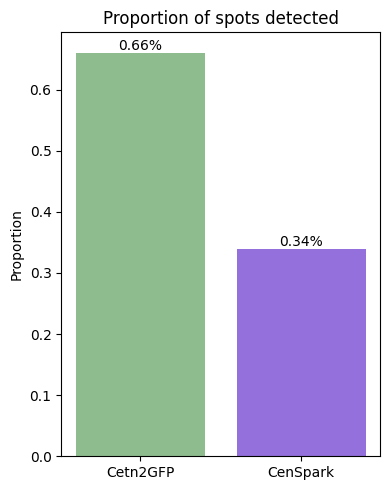

In [108]:
markers_nb_labels = ["Cetn2GFP", "CenSpark"]
tot_markers = nb_tot_CT_low + nb_tot_CS_low
markers_nb = [nb_tot_CT_low/tot_markers, nb_tot_CS_low/tot_markers]
nb_colors = ['darkseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(4,5))
bars = ax.bar(markers_nb_labels, markers_nb, color=nb_colors)

ax.set_ylabel("Proportion")
ax.set_title("Proportion of spots detected")
ax.bar_label(bars, fontsize=10,fmt='%.2f%%')

plt.tight_layout()
plt.show()

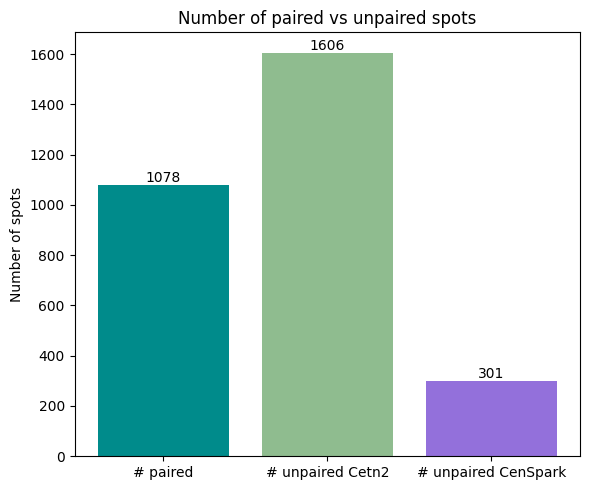

In [109]:
pairing_nb_labels = ["# paired", "# unpaired Cetn2", "# unpaired CenSpark"]
pairing_nb_low = [nb_paired_CS_low, nb_unpaired_CT_low, nb_unpaired_CS_low]
nb_colors = ['darkcyan', 'darkseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(6,5))
bars = ax.bar(pairing_nb_labels, pairing_nb_low, color=nb_colors)

ax.set_ylabel("Number of spots")
ax.set_title("Number of paired vs unpaired spots")
ax.bar_label(bars, fontsize=10)

plt.tight_layout()
plt.show()

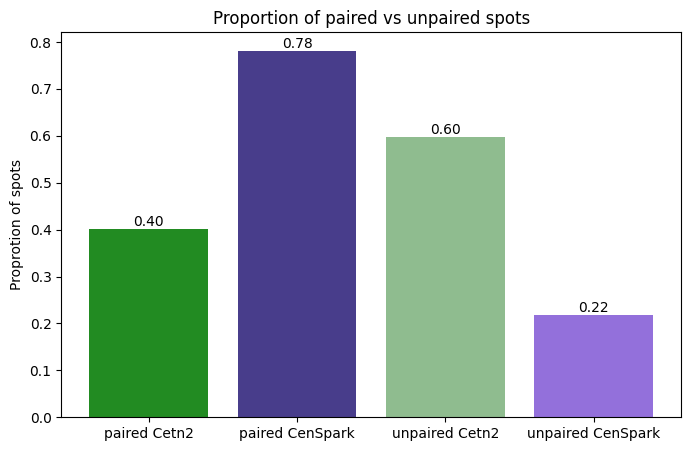

In [110]:
pairing_proportion_labels = ["paired Cetn2", "paired CenSpark", "unpaired Cetn2", "unpaired CenSpark"]
pairing_proportions_low = [nb_paired_CT_low/nb_tot_CT_low, nb_paired_CS_low/nb_tot_CS_low, nb_unpaired_CT_low/nb_tot_CT_low, nb_unpaired_CS_low/nb_tot_CS_low]
proportion_colors = ['forestgreen','darkslateblue', 'darkseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(8,5))
bars = ax.bar(pairing_proportion_labels, pairing_proportions_low, color=proportion_colors)

ax.set_ylabel("Proprotion of spots")
ax.set_title("Proportion of paired vs unpaired spots")
ax.bar_label(bars, fontsize=10,fmt='%.2f')
plt.show()

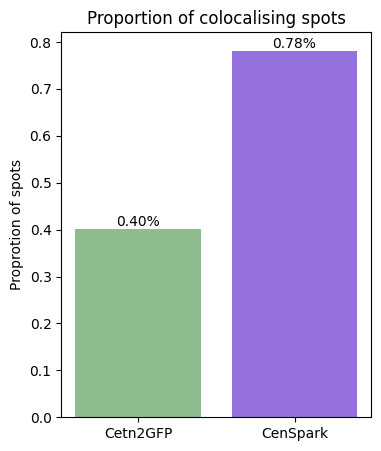

In [111]:
pairing_proportion_labels = ["Cetn2GFP", "CenSpark"]
pairing_proportions_low = [nb_paired_CT_low/nb_tot_CT_low, nb_paired_CS_low/nb_tot_CS_low]
proportion_colors = ['darkseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(4,5))
bars = ax.bar(pairing_proportion_labels, pairing_proportions_low, color=proportion_colors)

ax.set_ylabel("Proprotion of spots")
ax.set_title("Proportion of colocalising spots")
ax.bar_label(bars, fontsize=10,fmt='%.2f%%')
plt.show()

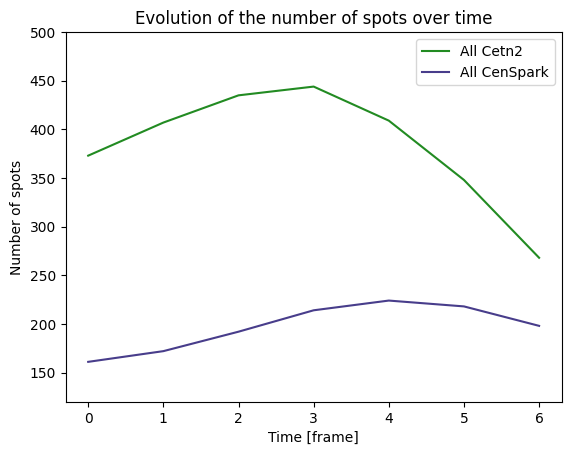

In [112]:
pairing_data_low = [ct_low_center_df, cs_center_df]
evolution_labels = ["All Cetn2", "All CenSpark"]
evolution_colors = ['forestgreen','darkslateblue']

for i in range(len(pairing_data_low)):
    count_over_time = pairing_data_low[i].groupby(["T"]).count()["index"].values
    plt.plot(count_over_time, label = evolution_labels[i], color = evolution_colors[i])

plt.title("Evolution of the number of spots over time")
plt.xlabel("Time [frame]")
plt.ylabel("Number of spots")
plt.ylim((120,500))
plt.legend()

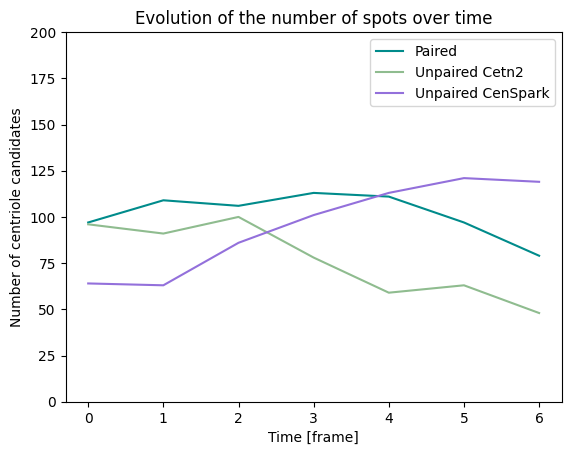

In [113]:
pairing_data_low = [ct_low_paired_df, ct_low_unpaired_df, cs_low_unpaired_df]
evolution_labels = ["Paired", "Unpaired Cetn2", "Unpaired CenSpark"]
evolution_colors = ['darkcyan', 'darkseagreen', 'mediumpurple']

for i in range(len(pairing_data_low)):
    count_over_time = pairing_data[i].groupby(["T"]).count()["index"].values
    plt.plot(count_over_time, label = evolution_labels[i], color = evolution_colors[i])

plt.title("Evolution of the number of spots over time")
plt.xlabel("Time [frame]")
plt.ylabel("Number of centriole candidates")
plt.ylim((0,200))
plt.legend()